# Binary Black Hole Signals in LIGO Open Data

- Maintainer: He Wang ([hewang@ucas.ac.cn](mailto:hewang@ucas.ac.cn))
- Refactored on: December 15, 2023
- Source: https://gwosc.org/GW150914data/LOSC_Event_tutorial_GW150914.html
    - Version 1.63, 2017 Sept 11

>This tutorial is intended for educational purposes. The code shown here is not used to produce results papers published by the LIGO Scientific Collaboration, which instead rely on special purpose analysis software packages.
>
>For publicly available, gravitational-wave software analysis packages that are used to produce LSC and Virgo Collaboration results papers, see https://losc.ligo.org/software/.
>
>For technical notes on this tutorial, see https://losc.ligo.org/bbh_tutorial_notes/

## Intro to signal processing

This tutorial assumes that you are comfortable with [python](https://www.python.org/).

This tutorial also assumes that you know a bit about signal processing of digital time series data (or want to learn!). This includes power spectral densities, spectrograms, digital filtering, whitening, audio manipulation. This is a vast and complex set of topics, but we will cover many of the basics in this tutorial.

If you are a beginner, here are some resources from the web:

- http://101science.com/dsp.htm
- https://www.coursera.org/course/dsp
- https://georgemdallas.wordpress.com/2014/05/14/wavelets-4-dummies-signal-processing-fourier-transforms-and-heisenberg/
- https://en.wikipedia.org/wiki/Signal_processing
- https://en.wikipedia.org/wiki/Spectral_density
- https://en.wikipedia.org/wiki/Spectrogram
- http://greenteapress.com/thinkdsp/
- https://en.wikipedia.org/wiki/Digital_filter

And, well, lots more on the web!

## Download the data on a computer with a python installation

If you are using a pre-configured setup (eg, in binder), great! You don't have to download or set up anything.

Otherwise, to begin, get the necessary files, by downloading the zip file and unpacking it into single directory:

- [LOSC_Event_tutorial.zip](https://losc.ligo.org/s/events/LOSC_Event_tutorial.zip)

This zip file contains:

- this IPython notebook LOSC_Event_tutorial.ipynb, and LOSC_Event_tutorial.py code.
- python code for reading LOSC data files: readligo.py.
- the event data files (32s sampled at 4096 Hz, in hdf5 format, for both LIGO detectors).
- waveform templates (32s sampled at 4096 Hz, in hdf5 format, for both plus and cross polarizations).
- a parameter file in json format

You will also need a python installation with a few packages ([numpy](http://www.numpy.org/), [matplotlib](http://matplotlib.org/), [scipy](https://www.scipy.org/), [h5py](http://www.h5py.org/), [json](https://docs.python.org/2/library/json.html) ).

- For hints on software installation, see https://losc.ligo.org/tutorial00/
- The tutorial should work on python 2.6 and above, including python 3, as well as in recent versions of Ipython.
- You might see Warning or FutureWarning messages, which tend to be associated with different versions of python, Ipython, numpy, etc. Hopefully they can be ignored!
- the filetype "hdf5" means the data are in hdf5 format: https://www.hdfgroup.org/HDF5/
- NOTE: GPS time is number of seconds since Jan 6, 1980 GMT. See http://www.oc.nps.edu/oc2902w/gps/timsys.html or https://losc.ligo.org/gps/

## Set the event name to choose event and the plot type

In [1]:
#-- SET ME   Tutorial should work with most binary black hole events
eventname = 'GW150914' 

# want plots?
make_plots = 1
plottype = "png"

In [2]:
# Standard python numerical analysis imports:
import numpy as np
import scipy
from scipy import signal
from scipy.interpolate import interp1d
from scipy.signal import butter, filtfilt, iirdesign, zpk2tf, freqz
import h5py
import json

# the IPython magic below must be commented out in the .py file, since it doesn't work there.
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab

# LIGO-specific readligo.py 
import LOSC_Event_tutorial.readligo as rl

from pprint import pprint

# you might get a matplotlib warning here; you can ignore it.

Need: [./LOSC_Event_tutorial/readligo.py](./LOSC_Event_tutorial/readligo.py)

## Read the event properties from a local json file (download in advance at `LOSA_Event_tutorial/`):

Need: [./LOSC_Event_tutorial/BBH_events_v3.json](./LOSC_Event_tutorial/BBH_events_v3.json)

In [3]:
# Read the event properties from a local json file
fnjson = "LOSC_Event_tutorial/BBH_events_v3.json"
try:
    events = json.load(open(fnjson,"r"))
except IOError:
    print("Cannot find resource file "+fnjson)
    print("You can download it from https://losc.ligo.org/s/events/"+fnjson)
    print("Quitting.")
    quit()

# did the user select the eventname ?
try: 
    events[eventname]
except:
    print('You must select an eventname that is in '+fnjson+'! Quitting.')
    quit()

In [4]:
# Extract the parameters for the desired event:
event = events[eventname]
fn_H1 = event['fn_H1']              # File name for H1 data
fn_L1 = event['fn_L1']              # File name for L1 data
fn_template = event['fn_template']  # File name for template waveform
fs = event['fs']                    # Set sampling rate
tevent = event['tevent']            # Set approximate event GPS time
fband = event['fband']              # frequency band for bandpassing signal
print("Reading in parameters for event " + event["name"])
pprint(event)

Reading in parameters for event GW150914
{'a1': 0.355,
 'a2': -0.769,
 'approx': 'lalsim.SEOBNRv2',
 'f_min': 10.0,
 'fband': [43.0, 300.0],
 'fn_H1': 'H-H1_LOSC_4_V2-1126259446-32.hdf5',
 'fn_L1': 'L-L1_LOSC_4_V2-1126259446-32.hdf5',
 'fn_template': 'GW150914_4_template.hdf5',
 'fs': 4096,
 'm1': 41.743,
 'm2': 29.237,
 'name': 'GW150914',
 'tevent': 1126259462.44,
 'utcevent': '2015-09-14T09:50:45.44'}


## Read in the data

We will make use of the data, and waveform template, defined above.

In [5]:
# 确认要加载的数据的存在性
!ls -lht LOSC_Event_tutorial/$fn_H1
!ls -lht LOSC_Event_tutorial/$fn_L1

-rw-r--r-- 1 root root 1017K Dec 12 12:35 LOSC_Event_tutorial/H-H1_LOSC_4_V2-1126259446-32.hdf5
-rw-r--r-- 1 root root 984K Dec 12 12:35 LOSC_Event_tutorial/L-L1_LOSC_4_V2-1126259446-32.hdf5


In [6]:
#----------------------------------------------------------------
# Load LIGO data from a single file.
# FIRST, define the filenames fn_H1 and fn_L1, above.
#----------------------------------------------------------------
try:
    # read in data from H1 and L1, if available:
    strain_H1, time_H1, chan_dict_H1 = rl.loaddata('LOSC_Event_tutorial/'+fn_H1, 'H1')
    strain_L1, time_L1, chan_dict_L1 = rl.loaddata('LOSC_Event_tutorial/'+fn_L1, 'L1')
except:
    print("Cannot find data files!")
    print("You can download them from https://losc.ligo.org/s/events/"+eventname)
    print("Quitting.")
    # quit()  # kernel restart!

In [7]:
# 了解你的数据！
print(strain_H1.shape, time_H1.shape, strain_H1.dtype, time_H1.dtype)
print(strain_L1.shape, time_L1.shape, strain_L1.dtype, time_L1.dtype)

(131072,) (131072,) float64 float64
(131072,) (131072,) float64 float64


In [8]:
# 数据一致性检查
assert np.alltrue(time_H1 == time_L1)
assert np.all(np.diff(time_H1))

In [9]:
# 采样率
print(1/np.diff(time_H1)[0], 'Hz')

# 采样频率（sample frequency）物理意义：物理上的每一秒时间范围里，有多少个采样点。

4096.0 Hz


In [10]:
# 测试一下。。。
time_H1[4096] - time_H1[0]

1.0

In [11]:
# pprint(chan_dict_H1)
pprint(chan_dict_L1)
chan_dict_H1['BURST_CAT1'].shape

{'BURST_CAT1': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=uint32),
 'BURST_CAT2': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=uint32),
 'BURST_CAT3': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=uint32),
 'CBC_CAT1': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=uint32),
 'CBC_CAT2': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=uint32),
 'CBC_CAT3': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=uint32),
 'DATA': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=uint32),
 'DEFAULT': array([1, 1, 

(32,)

- Data quality categories are as defined in the O1 data release. 
- Continuous Wave injections (CW) are present during most events at a very low amplitude, and do not interfere with transient detection.
- Data availability, data quality, and hardware injection segments are available: https://gwosc.org/archive/dataset/GW150914-v3/

## Data Gaps

**NOTE** that in general, LIGO strain time series data has gaps (filled with NaNs) when the detectors are not taking valid ("science quality") data. Analyzing these data requires the user to [loop over "segments"](https://losc.ligo.org/segments/) of valid data stretches.

**In this tutorial, for simplicity, we assume there are no data gaps - this will not work for all times!** See the [notes on segments](https://losc.ligo.org/segments/) for details.

## First look at the data from H1 and L1

In [12]:
# both H1 and L1 will have the same time vector, so:
time = time_H1
# the time sample interval (uniformly sampled!)
dt = time[1] - time[0]

# Let's look at the data and print out some stuff:

print('time_H1: len, min, mean, max = ', \
    len(time_H1), time_H1.min(), time_H1.mean(), time_H1.max() )
print('strain_H1: len, min, mean, max = ', \
    len(strain_H1), strain_H1.min(),strain_H1.mean(),strain_H1.max())
print( 'strain_L1: len, min, mean, max = ', \
    len(strain_L1), strain_L1.min(),strain_L1.mean(),strain_L1.max())

#What's in chan_dict?  (See also https://losc.ligo.org/tutorials/)
bits = chan_dict_H1['DATA']
print("For H1, {0} out of {1} seconds contain usable DATA".format(bits.sum(), len(bits)))
bits = chan_dict_L1['DATA']
print("For L1, {0} out of {1} seconds contain usable DATA".format(bits.sum(), len(bits)))

time_H1: len, min, mean, max =  131072 1126259446.0 1126259461.999878 1126259477.9997559
strain_H1: len, min, mean, max =  131072 -7.044665943156067e-19 5.895522509246437e-23 7.706262192397465e-19
strain_L1: len, min, mean, max =  131072 -1.8697138664279764e-18 -1.0522332249909908e-18 -4.60035111311666e-20
For H1, 32 out of 32 seconds contain usable DATA
For L1, 32 out of 32 seconds contain usable DATA


The event at 1126259462.44


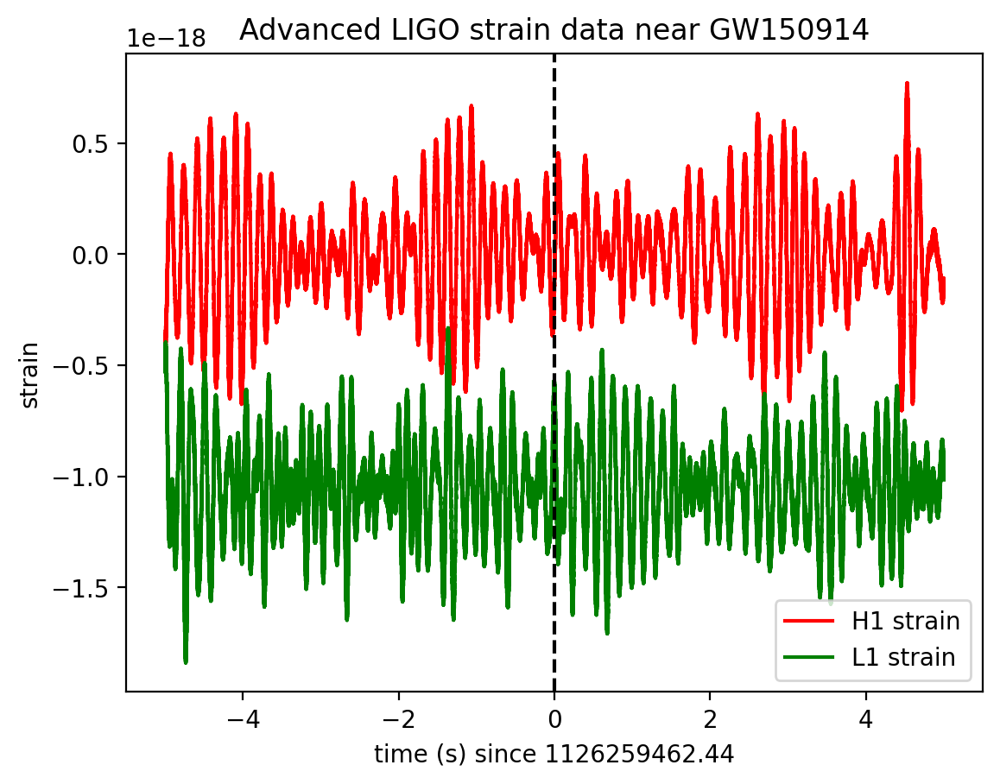

In [13]:
# plot +- deltat seconds around the event:
# index into the strain time series for this time interval:
deltat = 5
indxt = np.where((time >= tevent-deltat) & (time < tevent+deltat))  # 切片 GW150914 附近 ± 5秒的索引
print('The event at', tevent)

if make_plots:
    plt.figure()
    plt.plot(time[indxt]-tevent, strain_H1[indxt],'r',label='H1 strain')
    plt.plot(time[indxt]-tevent, strain_L1[indxt],'g',label='L1 strain')
    plt.axvline(0, color='k', ls='--')
    plt.xlabel('time (s) since '+str(tevent))
    plt.ylabel('strain')
    plt.legend(loc='lower right')
    plt.title('Advanced LIGO strain data near '+eventname)
    # plt.savefig(eventname+'_strain.'+plottype)

>FYI: 质子直径约 $1.6×10^{−15} m$
>
>引力波探测器是人类有史以来制造的最灵敏的“尺子”！

The data are dominated by **low frequency noise**; there is no way to see a signal here, without some signal processing.

## 【Basic】Understanding the FFT Algorithm by Python

- Refs:
    - My post: https://iphysresearch.github.io/blog/post/signal_processing/fft/
    - My PhD thesis: https://iphysresearch.github.io/PhDthesis_html/Appendix/#a_nyquist
    - https://pythonnumericalmethods.berkeley.edu/notebooks/chapter24.02-Discrete-Fourier-Transform.html
    

### 采样定理与 Nyquist 频率


我们先介绍关于引力波数据的采样定理以及其中与引力波数据处理相关的重要概念。

首先, 我们来介绍**采样**的过程, 即一个时序信号 $x(t)$ 会以每间隔 $\Delta t$ 秒的周期性进行采样, 如下方的图所示。

因此, 时间 $t$ 就可以以采样间隔 $\Delta t$ 为单位表述为:

$$
t=n \Delta t, n=0, \pm 1, \pm 2, \pm 3, \ldots
$$

<img src="https://iphysresearch.github.io/PhDthesis_html/img/App_ideal_sampler.png" style="width:800px;height:auto;">

> 对模拟信号的理想采样过程示意图。


---

显然，如果直接把采样后的离散样本点视作时序信号的话，就相当于是粗暴的把原始连续信号 $x(t)$ 切碎了，这样就会带来两个问题：

1. 为了确保采样后的离散信号是无损的，应该取更小的采样间隔 Δt，那该如何选择呢？
2. 采样会在频谱上会引起许多失真高频响应分量，并且这些高频频率分量会在频域上周期性的重复出现，如下图所示。

<img src="https://iphysresearch.github.io/PhDthesis_html/img/App_multifrequency.png" style="width:800px;height:auto;">

> 频谱上周期性重复出现高频响应的示意图


这个周期可以通过采样率 (sampling rate) 来表示：

$$
f_s=\frac{1}{\Delta t}
$$

对于采样后信号的重复频率谱来说, 如何唯一地确定原始频率究竟是哪一个呢? 

<details>
  <summary>点击折叠/展开</summary>
  

<img src="https://cdn.sa.net/2023/12/13/8DZeAFRrGom65y1.jpg" style="width:500px;height:auto;">
    
- Ref: 
    - https://courses.cs.washington.edu/courses/cse557/06wi/lectures/sampling.pdf
    - https://www.cs.utexas.edu/users/fussell/courses/cs384g-fall2011/lectures/lecture03-Sampling.pdf
    - https://zhuanlan.zhihu.com/p/437364577
  
</details>



采样定理 (sampling theorem) 提供了一种量化的答案, 其内容是对于某模拟信号 $x(t)$ 通过采样后, 得到一个较为准确的离散表征 $x(n \Delta t)$, 需要满足两个条件：

1. 模拟信号 $x(t)$ 必须是频谱有限的 (band-limited)。也就是说, 其频率谱必须要受限于某最大频率值 $f_{\max }$ 。
2. 采样率 $f_s$ 必须是至少大于两倍于最大频率值 $f_{\max }$, 即 $f_x \leq 2 f_{\max }$, 或者用采样间隔来表示: $\Delta t \leq \frac{1}{2 f_{\max }}$ 。

根据采样定理, 最小采样率为 $f_s=2 f_{\max }$, 这个频率就是 Nyquist rate。对于任意的某 $f_s$ 值来说, $f_s / 2$ 称为奈奎斯特频率 (Nyquist frequency), 据此可以定义出 Nyquist frequency interval 的边界|footnote \{在信号处理中, 区分各种常用的频率单位与相应的 Nyquist intervals 之间的关系是很重要的。举例来说, 一个采样后的正弦波可以采用不同的单位来表示: 

($e^{2 \pi i f n \Delta t}=e^{2 \pi i n\left(f / f_s\right)}=e^{i \Omega n \Delta t}=e^{i \omega n}$ )

$$
\left[-\frac{f_s}{2}, \frac{f_s}{2}\right]=\text { Nyquist frequency }
$$

简而言之, 采样定理为我们的采样率 $f_s$ 的选取给出了上限: 采样率 $f_s$ 无论如何都应该不能大于 $2 f_{\max }$ 。换句话说,在某一段有限长的时域信号里, 最大频率周期(亦对应最小时间周期)范围里的连续信号中, 采样点至少得有两个, 不然采样后的离散信号是无法表征原连续信号的, 如下图所示。


<img src="https://picx.zhimg.com/70/v2-45de375d74477b1f35d6cb0fa0a6175a_1440w.avis?source=172ae18b&biz_tag=Post" style="width:500px;height:auto;">

>不合适的采样率会造成离散信号信息混淆现象的示意图

- 小结一下：

    - 对于带限信号进行离散采样时，**只有采样频率高于其最高频率的2倍**，(即一个周期内，至少采2个点)，我们才能从采样信号中惟一正确地恢复原始带限信号。此处最高频率的2倍叫**奈奎斯特频率 (Nyquist frequency)**。若采样频率不满足此条件，就会让原始信号频谱产生 **频谱混叠 (aliasing)** 现象，从而无法正确恢复原始信号。

    - 如：某一原始信号频带是1~10Hz，要对其进行离散采样，则采样频率应该大于2*10=20Hz (即1秒钟采20个点，每个点的间隔为1/20=0.05 s )，此处的20Hz就是奈奎斯特频率。

    - 一般地，在采样之前，最好先进行低通滤波，以避免出现频谱混叠现象，比如：若采样频率为10Hz，那能恢复信号最高频率只有5Hz；这时若原始信号有大于5Hz的成分，不进行低通滤波直接采样就会发生频谱混叠。

![](https://pic3.zhimg.com/80/v2-e053f9744e43834f84c111878564885e_720w.webp)

>左图黑线是为始信号，黑点为采样点，黄线为由采样点恢复的信号频谱。
>
>右图不断增加的粉色区域沿着w轴的长度就是采样率，当采样率等于原始信号最高频率的2倍时，我们能正确恢复此信号。（图来自Wikipedia）

### 傅里叶变换

首先, 我们要清楚频率是什么, 以及如何该从一个信号序列中提取出频率信息呢? 我们正是要用傅里叶变换 (Fourier Transform) 来提取一段信号的频率信息。

那么, 从时域的信号 $x(t)$ 变换到频域的 $\tilde{x}(\omega)$ , 服从如下公式： $(\omega=2 \pi f)$
$$
\tilde{x}(f)=\int_{-\infty}^{+\infty} e^{-i \omega t} x(t) d t=\int_{-\infty}^{+\infty} e^{-2 \pi i f t} x(t) d t.
$$

这个方程是可逆的, 于是就有了所谓的从频域到时域的逆变换：
$$
x(t)=\int_{-\infty}^{+\infty} e^{i \omega t} \tilde{x}(\omega) \frac{d \omega}{2 \pi}=\int_{-\infty}^{+\infty} e^{2 \pi i f t} \tilde{x}(f) d f .
$$

更多的数学, 暂时不多说, 就引用这么一句话 (来自一本我特别喜欢的书 Introduction to Signal Processing, 本节都参考此书中的符号体系)

>The physical meaning of $\tilde{x}(f)$ is brought out by the inverse Fourier transform, which expresses the arbitrary signal $x(t)$ as a linear superposition of sinusoids of different frequencies.

简而言之, 傅里叶变换就是在不损失信息的情况下, 用不同的频域 basis 的线性组合来表示一个时域信号, 可以看做是一个基底展开。

在信号处理中, 我们的信号数据都是离散的, 于是就要考虑离散傅里叶变换 (discrete Fourier transform, DFT):

$$
\tilde{x}[k]=\sum_{n=0}^{N-1} e^{\frac{-2 \pi i}{N} k \cdot n} x[n] \quad, x[n]=\frac{1}{N} \sum_{k=0}^{N-1} e^{\frac{2 \pi i}{N} k \cdot n} \tilde{x}[k]
$$

其中, 信号采样点的数目是 $N$, 并且 $k, n=0, \ldots, N-1$ 。

显然, 根据上述傅里叶变换规则, 可以计算出频域里对应的第一个采样点的值, 就是时域信号所有采样点的平均和: $\tilde{x}[0]=\sum_{n=0}^{N-1} x[n]$ 。

特别要注意的是, 上面的公式仅是在 Python 中各个的 library 中 `fft()` 的定义, 与实际近似对应的连续时域信号是有差别的！即 **Numerical Approximation** ([REF](https://stackoverflow.com/a/24077914/8656360))。

它们之间应该是如下关系： $(d t=T / N=1 / f s)$
$$
\begin{gathered}
\tilde{x}(f)=\int_{-\infty}^{+\infty} e^{-2 \pi i f t} x(t) d t \simeq dt \cdot \left[\sum_{n=0}^{N-1} e^{\frac{-2 \pi i}{N} k \cdot n} x[n]\right] = dt \cdot \tilde{x}[k] \\
x(t)=\int_{-\infty}^{+\infty} e^{2 \pi i f t} \tilde{x}(f) d f \simeq \frac{1}{d t} \cdot \left[\frac{1}{N} \sum_{k=0}^{N-1} e^{\frac{2 \pi i}{N} k \cdot n} \tilde{x}[k]\right] = \frac{1}{d t} \cdot x[n].
\end{gathered}
$$

并且有：

$$
\tilde{x}(f) = \lim_{dt\rightarrow 0} dt \cdot \tilde{x}[k]
$$


其中, 信号采样点的数目是 $N$, 并且 $k, n=0, \ldots, N-1$ 。

<details>
  <summary>点击折叠/展开</summary>

这其实也可以从实际意义去理解, 因为 Library 里定义的傅里叶变换函数是仅依赖于一个有限采样的时域序列 $x[n]$就可以计算, 并不一定要知道该序列所代表的时长 $T$ 或采样率 $df$ 为何, 所以可以使代码得到更好的一般普适性。

> 多说一句的是，除了存在 Numerical Approximation，还有 Practical Approximations，即：
>
> 1. 我们必须取有限长的离散数据 $x[n]$ 进行截断的 DFT 计算。这引出了加窗（windowing）的概念，以及频谱（spectrum）的模糊（smearing）和泄漏（leakage）相关的效应。这些概念在频谱分析领域中是核心内容，将在后面讨论。
> 2. 我们必须决定在一组有限分辨率的频率 $f$ 上估计 $\tilde{X}(f)$。适当选择这组频率可以为 DFT 的各种高效计算算法的发展提供可能，比如后面也会介绍的快速傅立叶变换(FFT)。

</details>

接下来, 就终于进入到代码环节了。

我们通过对比手撸 FFT 代码和 Python 程序包自带的 `fft()` 函数来探求背后的计算原理, 理解程序包提供的函数的真正含义。

程序包主要选取的是： `numpy.fft` 和 `scipy.fftpack` (`pyfftw.FFTw` 暂略)

#### FFT from scratch (`DFT_slow`)

我们先根据定义, 纯手撸一个傅里叶变换 `DFT_slow` 看看效果如何（基于 `numpy`）。

借此还可以验证一些程序包中的 `fft()` 函数的含义。

其实很简单, 直接利用矩阵与向量的乘积, 就可以给出矢量化的定义:

$$
\begin{aligned}
\vec{X} & =M \cdot \vec{x} \\
M_{k n} & =e^{-2 \pi i k \cdot n / N}
\end{aligned}
$$

```python
import numpy as np
def DFT_slow(x):
    """Compute the discrete Fourier Transform of the 1D array x"""
    x = np.asarray(x, dtype=float)
    N = x.shape[0]
    n = np.arange(N)
    k = n.reshape((N, 1))
    M = np.exp(-2j * np.pi * k * n / N)
    return np.dot(M, x)
```

>上面的代码其实很清楚了。输入一个序列, 输出一个序列, 对应于上面公式中不考虑 $d t$ 信息的部分。

In [14]:
fs = 4096
time_array = np.arange(0, 1, 1/fs)
x = np.sin(time_array)
x

array([0.00000000e+00, 2.44140623e-04, 4.88281231e-04, ...,
       8.41075030e-01, 8.41207065e-01, 8.41339050e-01])

In [15]:
N = x.shape[0]
N

4096

In [16]:
n = np.arange(N)
k = n.reshape((N, 1))

n.shape, k.shape, (k * n).shape

((4096,), (4096, 1), (4096, 4096))

In [19]:
(k * n)

array([[       0,        0,        0, ...,        0,        0,        0],
       [       0,        1,        2, ...,     4093,     4094,     4095],
       [       0,        2,        4, ...,     8186,     8188,     8190],
       ...,
       [       0,     4093,     8186, ..., 16752649, 16756742, 16760835],
       [       0,     4094,     8188, ..., 16756742, 16760836, 16764930],
       [       0,     4095,     8190, ..., 16760835, 16764930, 16769025]])

In [20]:
type(1j)

complex

In [21]:
M = np.exp(-2j * np.pi * k * n / N)
print(M.shape)
M

(4096, 4096)


array([[1.        +0.j        , 1.        +0.j        ,
        1.        +0.j        , ..., 1.        +0.j        ,
        1.        +0.j        , 1.        +0.j        ],
       [1.        +0.j        , 0.99999882-0.00153398j,
        0.99999529-0.00306796j, ..., 0.99998941+0.00460193j,
        0.99999529+0.00306796j, 0.99999882+0.00153398j],
       [1.        +0.j        , 0.99999529-0.00306796j,
        0.99998118-0.00613588j, ..., 0.99995764+0.00920375j,
        0.99998118+0.00613588j, 0.99999529+0.00306796j],
       ...,
       [1.        +0.j        , 0.99998941+0.00460193j,
        0.99995764+0.00920375j, ..., 0.9999047 -0.01380539j,
        0.99995764-0.00920375j, 0.99998941-0.00460193j],
       [1.        +0.j        , 0.99999529+0.00306796j,
        0.99998118+0.00613588j, ..., 0.99995764-0.00920375j,
        0.99998118-0.00613588j, 0.99999529-0.00306796j],
       [1.        +0.j        , 0.99999882+0.00153398j,
        0.99999529+0.00306796j, ..., 0.99998941-0.00460193j,
 

In [22]:
np.dot(M, x).shape

(4096,)

In [23]:
def DFT_slow(x):
    """Compute the discrete Fourier Transform of the 1D array x"""
    x = np.asarray(x, dtype=float)
    N = x.shape[0]
    n = np.arange(N)
    k = n.reshape((N, 1))
    M = np.exp(-2j * np.pi * k * n / N)
    return np.dot(M, x)

In [24]:
DFT_slow(x)

array([1882.50101032  +0.j        ,  -49.3552352 +562.80983113j,
        -12.42047533+276.02463083j, ...,   -5.73514268-183.36702601j,
        -12.42047533-276.02463083j,  -49.3552352 -562.80983113j])

In [25]:
# Compute the one-dimensional discrete Fourier Transform.

# This function computes the one-dimensional *n*-point discrete Fourier
# Transform (DFT) with the efficient Fast Fourier Transform (FFT)
# algorithm [CT].

np.fft.fft(x)

array([1882.50101032  +0.j        ,  -49.3552352 +562.80983113j,
        -12.42047533+276.02463083j, ...,   -5.73514268-183.36702601j,
        -12.42047533-276.02463083j,  -49.3552352 -562.80983113j])

In [26]:
print(np.allclose(DFT_slow(x), np.fft.fft(x)))

True


很快你就知道, 其实上面算法的执行效率是很低的。于是就有了下面你的改进版本：

#### FFT from scratch (`FFT`)

<details>
  <summary>点击折叠/展开</summary>

优化算法时最重要的工具之一是利用问题的对称性。

如果你能证明问题的一部分与另一部分有简单的关系，那么你只需要计算一次子结果，就可以节省那部分的计算成本。

当年Cooley和Tukey在推导快速傅里叶变换（FFT）时就使用了这种方法。

我们首先问的是$X_{N+k}$的值是多少。从我们上面的表达式：

$$
\begin{aligned}
X_{N+k} & =\sum_{n=0}^{N-1} x_n \cdot e^{-i 2 \pi(N+k) n / N} \\
& =\sum_{n=0}^{N-1} x_n \cdot e^{-i 2 \pi n} \cdot e^{-i 2 \pi k n / N} \\
& =\sum_{n=0}^{N-1} x_n \cdot e^{-i 2 \pi k n / N} = X_k
\end{aligned}
$$

其中我们使用了恒等式$\exp [2 \pi i n]=1$，这对任何整数$n$都成立。

最后一行显示了DFT的一个很好的对称性质：

$$
X_{N+k}=X_k .
$$

通过一个简单的扩展，

$$
X_{k+i \cdot N}=X_k
$$

对任何整数 $i$ 都成立。如下面我们将看到，这种对称性可以被利用来更快地计算DFT。

</details>


根据对称性,

$$
\vec{X}_{k+i \cdot N}=\vec{X}_k \quad, \text { for any integer i }
$$

可以给出一个更高效的递归算法方案。

<details>
  <summary>点击折叠/展开</summary>
  
Cooley和Tukey展示了可以将DFT计算分为两个较小部分的可能性。从DFT的定义我们有：

$$
\begin{aligned}
X_k & =\sum_{n=0}^{N-1} x_n \cdot e^{-i 2 \pi k n / N} \\
& =\sum_{m=0}^{N / 2-1} x_{2 m} \cdot e^{-i 2 \pi k(2 m) / N}+\sum_{m=0}^{N / 2-1} x_{2 m+1} \cdot e^{-i 2 \pi k(2 m+1) / N} \\
& =\sum_{m=0}^{N / 2-1} x_{2 m} \cdot e^{-i 2 \pi k m /(N / 2)}+e^{-i 2 \pi k / N} \sum_{m=0}^{N / 2-1} x_{2 m+1} \cdot e^{-i 2 \pi k m /(N / 2)}
\end{aligned}
$$

我们将单个离散傅立叶变换分为两个看起来非常像较小的离散傅立叶变换的项，一个在奇数值上，一个在偶数值上。

然而，到目前为止，我们还没有节省任何计算周期。每个项由 $(N / 2) \times N$ 个计算组成，总共 $N^2$ 个。

技巧在于利用这些项中的对称性。因为$k$的范围是$0 \leq k<N$，而$n$的范围是$0 \leq n<M \equiv N / 2$，我们从上面的对称性属性中看到，我们只需要对每个子问题进行一半的计算。

我们的$\mathcal{O}\left[N^2\right]$计算变成了$\mathcal{O}\left[M^2\right]$，其中$M$是$N$的一半。

但是没有理由在这里停下来：只要我们的较小傅立叶变换有一个偶数值的$M$，我们就可以重新应用这种分而治之的方法，每次将计算成本减半，直到我们的数组足够小，这种策略不再有益。

在渐近极限下，这种递归方法的规模为$\mathcal{O}[N \log N]$。

这种递归算法可以在Python中非常快速地实现，当子问题的大小变得比较小时，回退到我们的慢速DFT代码：

```python
def FFT(x):
    """A recursive implementation of the 1D Cooley-Tukey FFT"""
    x = np.asarray(x, dtype=float)
    N = x.shape[0]
    
    if N % 2 > 0:
        raise ValueError("size of x must be a power of 2")
    elif N <= 32:  # this cutoff should be optimized
        return DFT_slow(x)
    else:
        X_even = FFT(x[::2])
        X_odd = FFT(x[1::2])
        factor = np.exp(-2j * np.pi * np.arange(N) / N)
        return np.concatenate([X_even + factor[:N // 2] * X_odd,
                               X_even + factor[N // 2:] * X_odd])
```
  
</details>


In [27]:
def FFT(x):
    """A recursive implementation of the 1D Cooley-Tukey FFT"""
    x = np.asarray(x, dtype=float)
    N = x.shape[0]
    
    if N % 2 > 0:
        raise ValueError("size of x must be a power of 2")
    elif N <= 32:  # this cutoff should be optimized
        return DFT_slow(x)
    else:
        X_even = FFT(x[::2])
        X_odd = FFT(x[1::2])
        factor = np.exp(-2j * np.pi * np.arange(N) / N)
        return np.concatenate([X_even + factor[:N // 2] * X_odd,
                               X_even + factor[N // 2:] * X_odd])

In [28]:
print(np.allclose(DFT_slow(x), FFT(x)))

True


#### FFT from scratch (`FFT_vectorized`)

将上一个算法进一步矢量化，就可以进一步提高代码的执行效率。

<details>
  <summary>点击折叠/展开</summary>
  

- 向量化的Numpy版本

注意，在上述递归FFT实现中，最低递归级别我们执行 $N / 32$ 个相同的矩阵-向量乘积。

我们的算法的效率将受益于一次性计算这些矩阵-向量乘积作为单个矩阵-矩阵乘积。

在每个后续的递归级别，我们也执行可以向量化的重复操作。

NumPy在这种操作上表现出色，我们可以利用这个事实来创建快速傅立叶变换的向量化版本：

```python

def FFT_vectorized(x):
    """A vectorized, non-recursive version of the Cooley-Tukey FFT"""
    x = np.asarray(x, dtype=float)
    N = x.shape[0]

    if np.log2(N) % 1 > 0:
        raise ValueError("size of x must be a power of 2")

    # N_min here is equivalent to the stopping condition above,
    # and should be a power of 2
    N_min = min(N, 32)
    
    # Perform an O[N^2] DFT on all length-N_min sub-problems at once
    n = np.arange(N_min)
    k = n[:, None]
    M = np.exp(-2j * np.pi * n * k / N_min)
    X = np.dot(M, x.reshape((N_min, -1)))

    # build-up each level of the recursive calculation all at once
    while X.shape[0] < N:
        X_even = X[:, :X.shape[1] // 2]
        X_odd = X[:, X.shape[1] // 2:]
        factor = np.exp(-1j * np.pi * np.arange(X.shape[0])
                        / X.shape[0])[:, None]
        X = np.vstack([X_even + factor * X_odd,
                       X_even - factor * X_odd])

    return X.ravel()
```
    
</details>


In [29]:
def FFT_vectorized(x):
    """A vectorized, non-recursive version of the Cooley-Tukey FFT"""
    x = np.asarray(x, dtype=float)
    N = x.shape[0]

    if np.log2(N) % 1 > 0:
        raise ValueError("size of x must be a power of 2")

    # N_min here is equivalent to the stopping condition above,
    # and should be a power of 2
    N_min = min(N, 32)
    
    # Perform an O[N^2] DFT on all length-N_min sub-problems at once
    n = np.arange(N_min)
    k = n[:, None]
    M = np.exp(-2j * np.pi * n * k / N_min)
    X = np.dot(M, x.reshape((N_min, -1)))

    # build-up each level of the recursive calculation all at once
    while X.shape[0] < N:
        X_even = X[:, :X.shape[1] // 2]
        X_odd = X[:, X.shape[1] // 2:]
        factor = np.exp(-1j * np.pi * np.arange(X.shape[0])
                        / X.shape[0])[:, None]
        X = np.vstack([X_even + factor * X_odd,
                       X_even - factor * X_odd])

    return X.ravel()

In [30]:
print(np.allclose(DFT_slow(x), FFT_vectorized(x)))

True


#### Fast FFT from scratch (FFT_fast)

- 快速傅里叶变换(FFT)——有史以来最巧妙的算法？: [Bilibili](https://www.bilibili.com/video/BV1za411F76U)

#### Verification of correctness for the code

In [31]:
x = np.random.random(1024)
print(np.allclose(DFT_slow(x), np.fft.fft(x)))
print(np.allclose(DFT_slow(x), FFT(x)))
print(np.allclose(DFT_slow(x), FFT_vectorized(x)))

import scipy
print(np.allclose(DFT_slow(x), scipy.fftpack.fft(x)))

True
True
True
True


> 验证得知，我们定义的 DFT 算法与 `np.fft.fft(x)` 和 `scipy.fftpack.fft(x)` 的结果是一致的。

#### Efficiency of the algorithms

然后，再验证下所有手撸算法和程序包函数的执行效率。

In [32]:
x = np.random.random(1024)
%timeit DFT_slow(x)
%timeit FFT(x)
%timeit FFT_vectorized(x)
%timeit np.fft.fft(x)
%timeit scipy.fftpack.fft(x)

59 ms ± 4.79 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
2.41 ms ± 43.1 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
261 µs ± 339 ns per loop (mean ± std. dev. of 7 runs, 1,000 loops each)
14 µs ± 15.2 ns per loop (mean ± std. dev. of 7 runs, 100,000 loops each)
12.3 µs ± 19.7 ns per loop (mean ± std. dev. of 7 runs, 100,000 loops each)


可以看到程序包的执行速率是远比手撸的代码执行速度快的，在数量级上的效率提升，此后都将只用程序包中的函数计算 FFT。

#### 频域索引和频域坐标之间的映射关系 (`numpy.fft.fftfreq`)

在用 Python 做信号处理时, 还需要留意的细节是信号在频域上是如何表示的。

上文已经谈到过, 根据采样定理, 我们可以给出一定时间间隔 T 范围内信号的可能频率范围, 即 Nyquist frequency interval。

首先, 最小频率(绝对值)是 0 , 然而可能的最小正频对应的是该时长为 $T$ 的信号里周期次数仅为 1 , 所以最小正频应该是 $1 / T$ 。

那么最大正频就应该是该时长为 $\mathrm{T}$ 的信号里, 在给定采样点数目为 $\mathrm{N}$ 的情况下, 可以接受的信号周期的最大数目。

根据上文讨论过的 Nyquist limit, 一般来说, 如果有奇数个采样点 $\mathrm{N}$, 那就最多重构 ( $\mathrm{N}-1) / 2$ 个信号周期, 如果是偶数个采样点 $\mathrm{N}$, 那最多就重构 N/2-1 个信号周期。

用 Python 语言来表示会更简单, 那就是 N//2-1 个信号周期 (// 在 Python 中表示向下取整)。

关于负频也是同样道理, 不过在频域上很容易出错的一点, 那就是我们一般并不会真的将负频表示在频域的负数范围里, 而是会将其映射在正频的右侧方向上来表征。

<img src="https://iphysresearch.github.io/PhDthesis_html/img/C2_np_fft_freqs.png" style="width:500px;height:auto;">


所以，表示在频域上的序列索引 (frequenct index) 与对应的频率坐标(frequency coordinate)的对应关系, 如上图所示, 蓝色部分对应的是 0 和 正频, 橙色部分对应的是负频。横轴 index 表示在序列中的索引指标, 纵轴 coordinate 就是对应的频率值。

综上所示, 只要给定某信号的总采样点数目 $\mathrm{N}$ 和采样率, 我们就总可以在频域上确定是如何采样的 (同 `numpy.fft.fftfreq`):

$$
f=[0,1, \ldots, N / / 2-1,-N / / 2, \ldots,-1] / T
$$

其中, $T=N / f_s$ 。

In [ ]:
# Signature: np.fft.fftfreq(n, d=1.0)
# Docstring:
# Return the Discrete Fourier Transform sample frequencies.

# The returned float array `f` contains the frequency bin centers in cycles
# per unit of the sample spacing (with zero at the start).  For instance, if
# the sample spacing is in seconds, then the frequency unit is cycles/second.

# Given a window length `n` and a sample spacing `d`::

#   f = [0, 1, ...,   n/2-1,     -n/2, ..., -1] / (d*n)   if n is even
#   f = [0, 1, ..., (n-1)/2, -(n-1)/2, ..., -1] / (d*n)   if n is odd

np.fft.fftfreq

### Amplitude Spectrum

In [40]:
N = 4096 # number of samples

fs = 100 # sampling frequency
dt = 1./fs # time discretisation

time_array = np.arange(N)*dt # time sampling

A = 0.067 # sine wave amplitude
f = 10.24 # sine wave frequency
strain = A*np.sin(2*np.pi*f*time_array) # sine wave

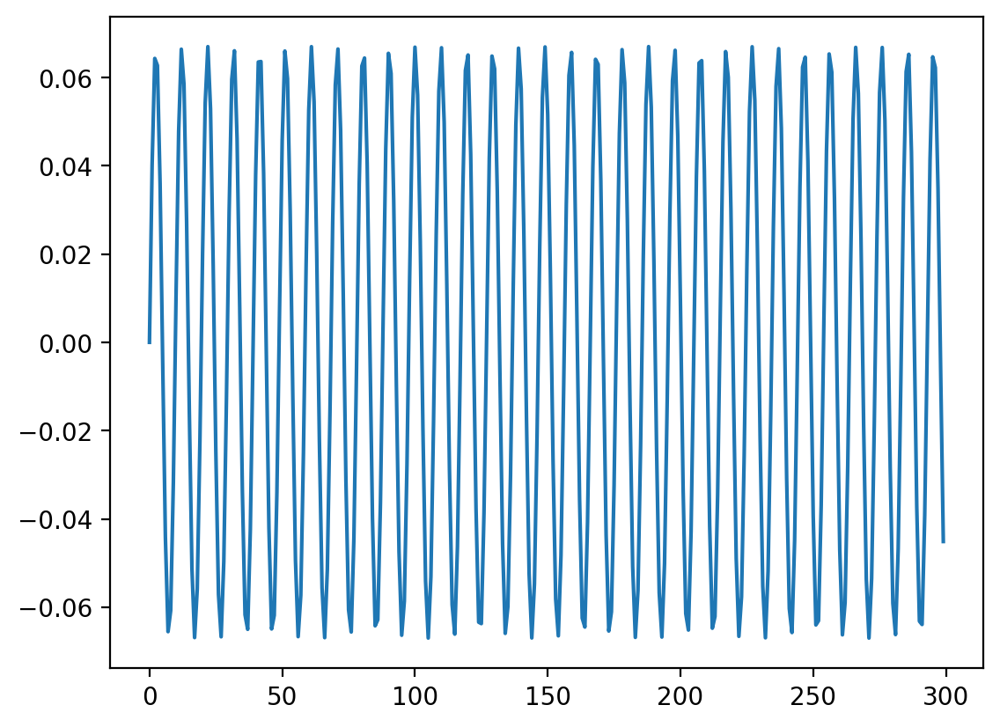

In [43]:
plt.plot(strain[:300])

In [45]:
freqs = np.fft.fftfreq(N, d=1./fs)
amp_spectrum_twosided = abs(DFT_slow(strain)/N)   # 用总采样的数目 N 来归一化 => Amplitude spectrum 幅度谱

# np.fft.fftshift: shift the zero-frequency component to the center of the spectrum.
assert np.alltrue(np.fft.fftshift(freqs) == np.roll(freqs, shift=N//2))

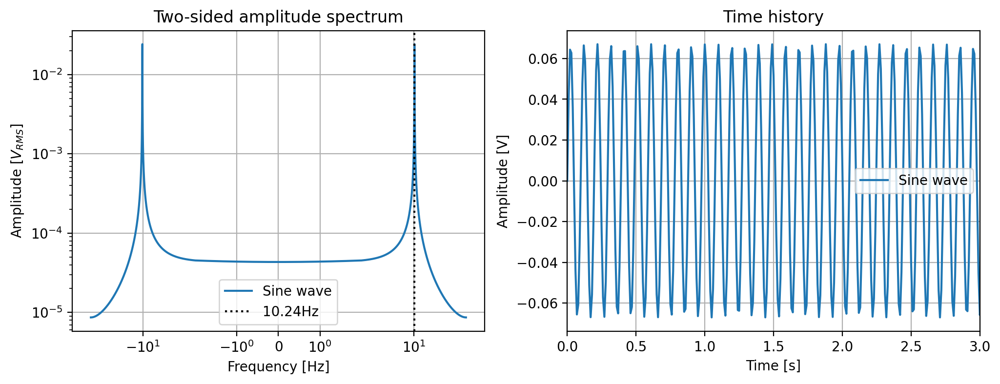

In [46]:
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.plot(np.fft.fftshift(freqs),
         np.fft.fftshift(amp_spectrum_twosided), label='Sine wave')
plt.xscale('symlog')
plt.yscale('log')
plt.axvline(f, label=f'{f}Hz', ls=':', color='k')
plt.title('Two-sided amplitude spectrum')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude [$V_{RMS}$]')
plt.legend()
plt.grid();

plt.subplot(1,2,2)
plt.plot(time_array, strain, label='Sine wave')
plt.title('Time history')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude [V]')
plt.xlim(0,3)
plt.legend()
plt.grid();

In [48]:
fs

100

In [49]:
max(freqs)  # 果然是小于 fs=100Hz 的一半。

49.9755859375

关于这些图表，有几个方面值得一提：

1. 幅度谱包括正频率和负频率，这就是为什么它被称为双边频谱 (**two-sided** spectrum)；

2. 它们关于原点对称，这源于实信号的傅立叶变换是Hermitian的事实；

3. 峰值出现在相同的频率上，这个频率非常接近，但并不等于正弦波的频率。这个问题与fft的频率分辨率等等有关，而这又受到信号持续时间的影响(能谱泄露等等。。。)。

**正弦波的双边幅度谱的理论值**等于正弦波幅度($A$)除以2倍根号2：

$$\left| FT_{2sided} \right| = \frac{A}{2 \cdot \sqrt 2} = \frac{A_{RMS}}{2}$$

<details>
  <summary>点击折叠/展开</summary>
  
- 均方根(Root Mean Square) 
```python
def rms_flat(a):
    """
    Return the root mean square of all the elements of *a*, flattened out.
    Ref: https://matplotlib.org/2.2.5/_modules/matplotlib/mlab.html#rms_flat
    """
    return np.sqrt(np.mean(np.abs(a) ** 2))
```
  
</details>


In [51]:
print(f'{max(amp_spectrum_twosided):.6f}, {A/(2*np.sqrt(2)):.6f}')

0.024192, 0.023688


随着信号持续时间向无穷大增加，实际值和理论值之间的差异将变得更小。这个方面也影响了上面提到的频率分辨率，影响了本 notebook 中大部分数值比较的结果。

现在，我们将利用傅立叶变换与实信号的对称性质，仅计算非负频率项。有两种选项可以实现这一点：

1. 截断FFT ： 基本上就是只计算感兴趣的项；
2. 折叠FFT ： 计算FFT的坐标，就好像它们围绕 Nyquist 频率折叠以获得 **单边频谱**（one-sided spectrum）。

In [52]:
# 1. 截断FFT ： 基本上就是只计算感兴趣的项；
freqs_truncated = np.fft.rfftfreq(N, d=1./fs)
# Compute the one-dimensional discrete Fourier Transform for real input.
amp_spectrum_truncated = abs(np.fft.rfft(strain)/N)   # 用总采样的数目 N 来归一化

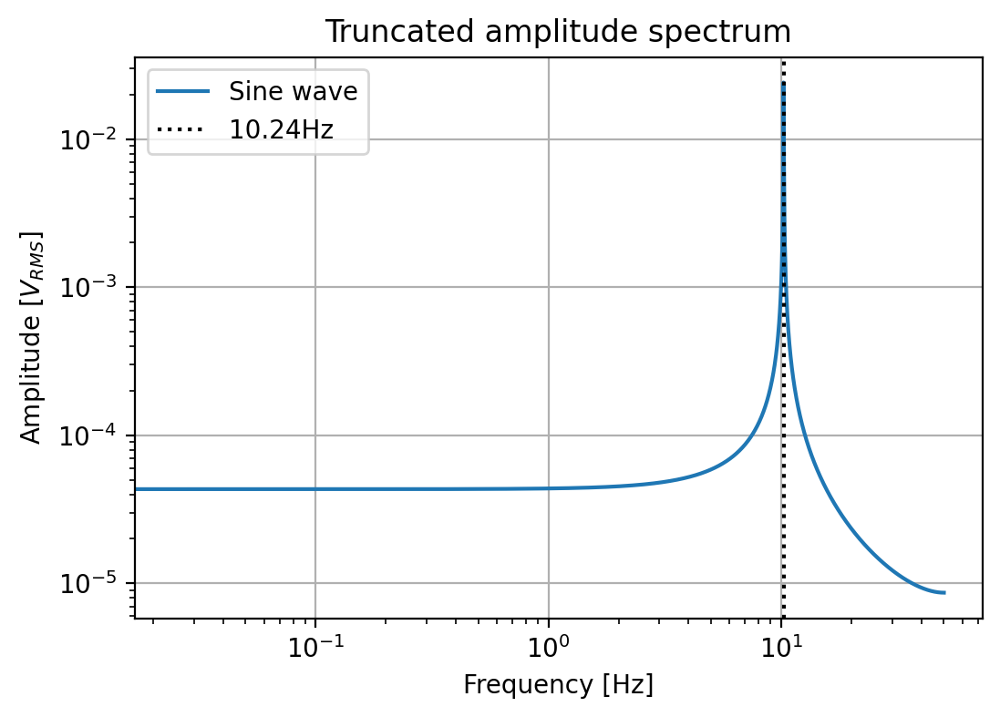

In [53]:
plt.figure(figsize=(6,4))
plt.loglog(freqs_truncated, amp_spectrum_truncated, label='Sine wave')
plt.axvline(f, label=f'{f}Hz', ls=':', color='k')
plt.title('Truncated amplitude spectrum')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude [$V_{RMS}$]')
plt.legend()
plt.grid();

In [54]:
np.allclose(amp_spectrum_truncated, amp_spectrum_twosided[:amp_spectrum_truncated.shape[0]]  )

True

可以看到，这些截断的幅度谱与之前的双边幅度谱完全相同，但是只计算了非负频率项。

In [57]:
# 2. 折叠FFT ： 计算FFT的坐标，就好像它们围绕 Nyquist 频率折叠以获得 单边频谱（one-sided spectrum）。
scale = 2.*np.ones_like(freqs_truncated) # scale rfft components by a factor of 2
scale[0] = 1. #  the DC component is not scaled
if scale.size % 2 == True: # if there is a Nyquist component...
    scale[-1] = 1. # ...then it is not scaled
amp_spectrum_onesided = amp_spectrum_truncated * scale

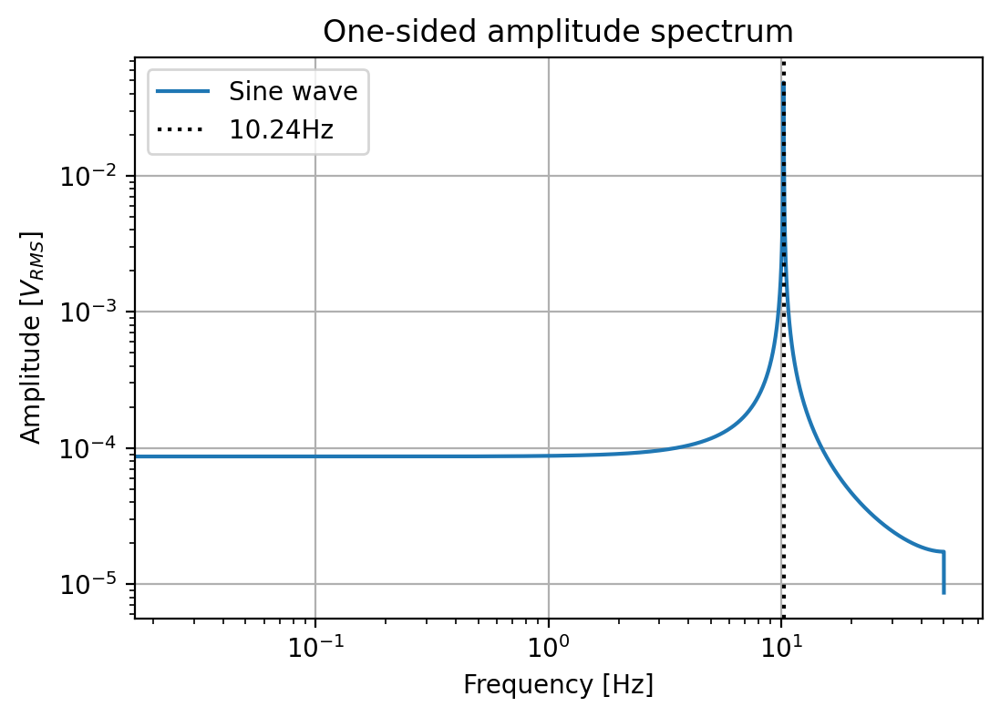

In [58]:
plt.figure(figsize=(6,4))
plt.loglog(freqs_truncated, amp_spectrum_onesided, label='Sine wave')
plt.axvline(f, label=f'{f}Hz', ls=':', color='k')
plt.title('One-sided amplitude spectrum')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude [$V_{RMS}$]')
plt.legend()
plt.grid();

正弦波单边幅度谱的理论值等于正弦波的均方根(RMS)，这就是为什么幅度谱的单位通常被称为平方均方根(squared RMS)，其中量纲是时域信号的单位。

$$\left| FT_{1sided} \right| = 2 \cdot \left| FT_{2sided} \right| = 2 \cdot \frac{A}{2 \cdot \sqrt 2} = \frac{A}{\sqrt 2} = A_{RMS}$$

In [59]:
print(f'{max(amp_spectrum_onesided):.6f}, {A/np.sqrt(2):.6f}')

0.048384, 0.047376


与样本信号的单边幅度谱中的主要峰值相比，对应于正弦波频率的峰值仍然几乎无法辨别。


| Amplitude spectra | Fourier transform | Power spectra |
| :---: | :---: | :---: |
| Two-sided (peak) | $\frac{A}{2} = \frac{A_{RMS}}{\sqrt 2}$ | $\frac{A^2}{4} = \frac{{A_{RMS}}^2}{2}$ |
| Two-sided (RMS) | $\frac{A}{2 \cdot \sqrt 2} = \frac{A_{RMS}}{2}$ | $\frac{A^2}{8} = \frac{{A_{RMS}}^2}{4}$ |
| One-sided (peak) | $A = \sqrt 2 \cdot A_{RMS}$ | $\frac{A^2}{2} = {A_{RMS}}^2$ |
| One-sided (RMS) | $\frac{A}{\sqrt 2} = A_{RMS}$ | $\frac{A^2}{4} = \frac{{A_{RMS}}^2}{2}$ |

FROM: https://notebook.community/pxcandeias/py-notebooks/DSP_FFT_psd

### Power Spectrum


In [60]:
N = 4096 # number of samples

fs = 100 # sampling frequency
dt = 1./fs # time discretisation

time_array = np.arange(N)*dt # time sampling

A = 0.067 # sine wave amplitude
f = 10.24 # sine wave frequency
strain = A*np.sin(2*np.pi*f*time_array) # sine wave

In [61]:
freqs = np.fft.fftfreq(N, d=1./fs)
poser_spectrum_twosided = DFT_slow(strain) * np.conj(DFT_slow(strain))
poser_spectrum_twosided = np.real(poser_spectrum_twosided)

In [68]:
abs(DFT_slow(strain))**2 # 模平方

array([0.03146645, 0.03146687, 0.0314681 , ..., 0.03147016, 0.0314681 ,
       0.03146687])

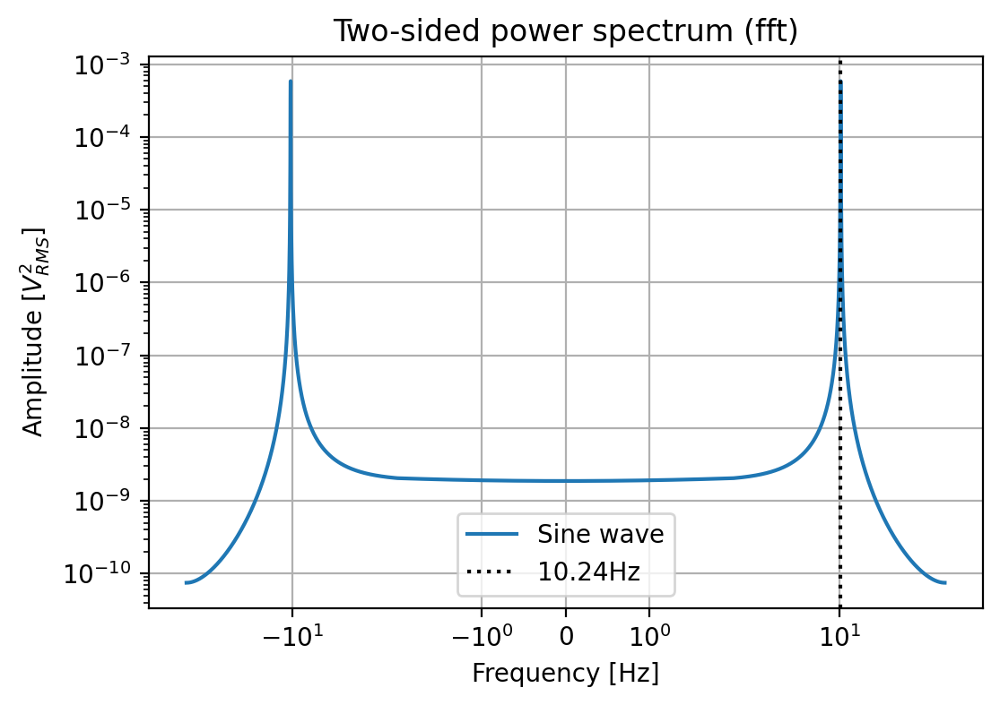

In [69]:
plt.figure(figsize=(6,4))
plt.plot(np.fft.fftshift(freqs),
         np.fft.fftshift(poser_spectrum_twosided)/N**2, label='Sine wave')
plt.xscale('symlog')
plt.yscale('log')
plt.axvline(f, label=f'{f}Hz', ls=':', color='k')
plt.title('Two-sided power spectrum (fft)')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude [$V_{RMS}^2$]')
plt.legend()
plt.grid();

**正弦波双边功率谱** 的理论值等于正弦波双边幅度谱的平方，即正弦波幅度($A$)的平方除以8：

$$\left| S_{2sided} \right| = {\left( \frac{A}{2 \cdot \sqrt 2} \right)}^2 = \frac{A^2}{8} = \frac{{A_{RMS}}^2}{4}$$

In [63]:
print(f'{max(poser_spectrum_twosided)/N**2:.6f}, {(A**2/8):.6f}')

0.000585, 0.000561


### Windowing

REF: https://iphysresearch.github.io/PhDthesis_html/C2/#233

上面我们讲到过，快速傅里叶变换（FFT）输入信号本质上是要被截断的，这是 DSP 不得不面对的情况。

这种截断可以被模型化为一个无限信号与一个矩形窗函数的乘积。

在频谱域中，这种乘法变成了信号频谱与窗函数频谱的卷积，这种卷积是造成频谱泄露（请参见[Wiki](https://en.wikipedia.org/wiki/Window_function)）效应的原因。

使用专用的窗函数对信号进行窗口化处理有助于减轻频谱泄露。

<img src="https://cdn.sa.net/2023/12/14/c1CmpXMS7Fh95iq.jpg" style="width:600px;height:auto;">

>(左图) 不同窗函数的时域图像 (右图) 以 Nyquist frequency 为单位频域，不同窗函数能谱泄露的幅度


下面的例子展示了窗口化处理的效果。

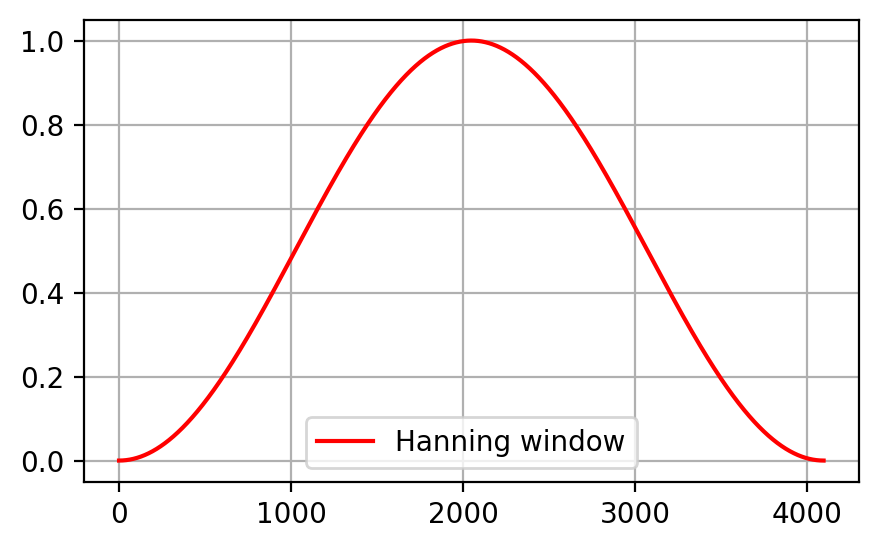

In [71]:
# 紧跟上一小节的例子
win = np.hanning(strain.size)
plt.figure(figsize=(5,3))
plt.plot(win, 'r-', label='Hanning window')
plt.grid()
plt.legend()

freqs = np.fft.fftfreq(N, d=1./fs)
poser_spectrum_twosided_win = DFT_slow(strain * win) * np.conj(DFT_slow(strain * win))
poser_spectrum_twosided_win = np.real(poser_spectrum_twosided_win)

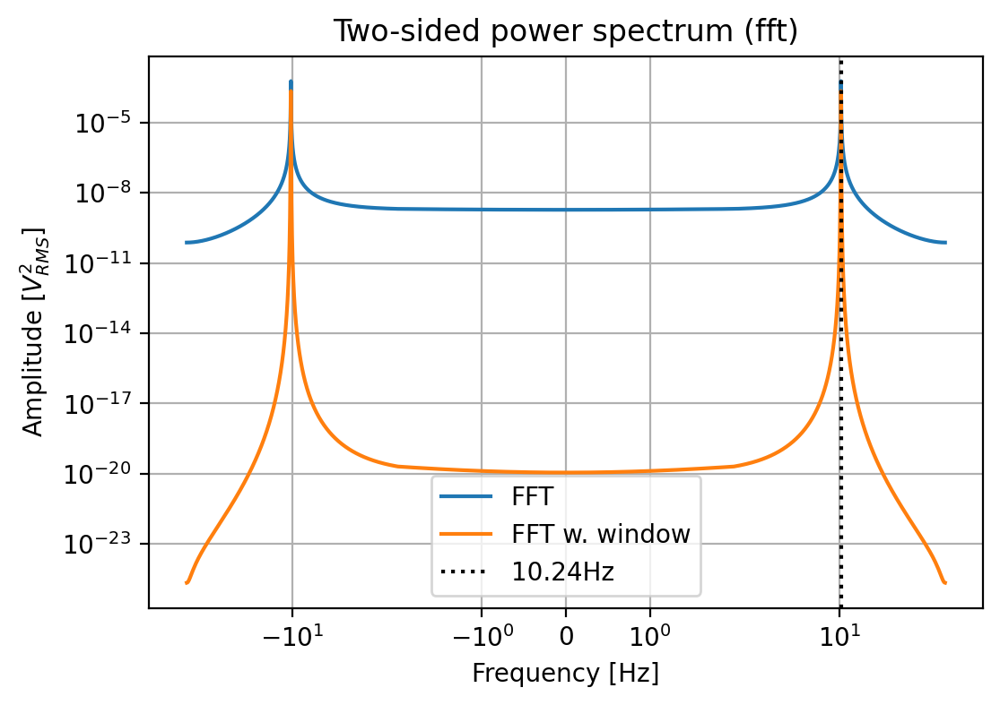

In [72]:
plt.figure(figsize=(6,4))
plt.plot(np.fft.fftshift(freqs),
         np.fft.fftshift(poser_spectrum_twosided)/N**2, label='FFT')
plt.plot(np.fft.fftshift(freqs),
         np.fft.fftshift(poser_spectrum_twosided_win)/N**2, label='FFT w. window')
plt.xscale('symlog')
plt.yscale('log')
plt.axvline(f, label=f'{f}Hz', ls=':', color='k')
plt.title('Two-sided power spectrum (fft)')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude [$V_{RMS}^2$]')
plt.legend()
plt.grid();

In [73]:
print(f'{max(poser_spectrum_twosided_win)/(win**2).mean()/N**2:.6f}, {(A**2/8):.6f}')

0.000587, 0.000561


## 【Basic】Spectral Analysis (谱分析)


> 这是一个非常不够系统的介绍，目的仅仅是确保能让你明白下一章的 ASD / PSD 是怎么来的？


- Refs:
    - My post: https://iphysresearch.github.io/blog/post/signal_processing/spectral_analysis_scipy/
    - https://labcit.ligo.caltech.edu/~ajw/ph4/fftasd.py (Private access)

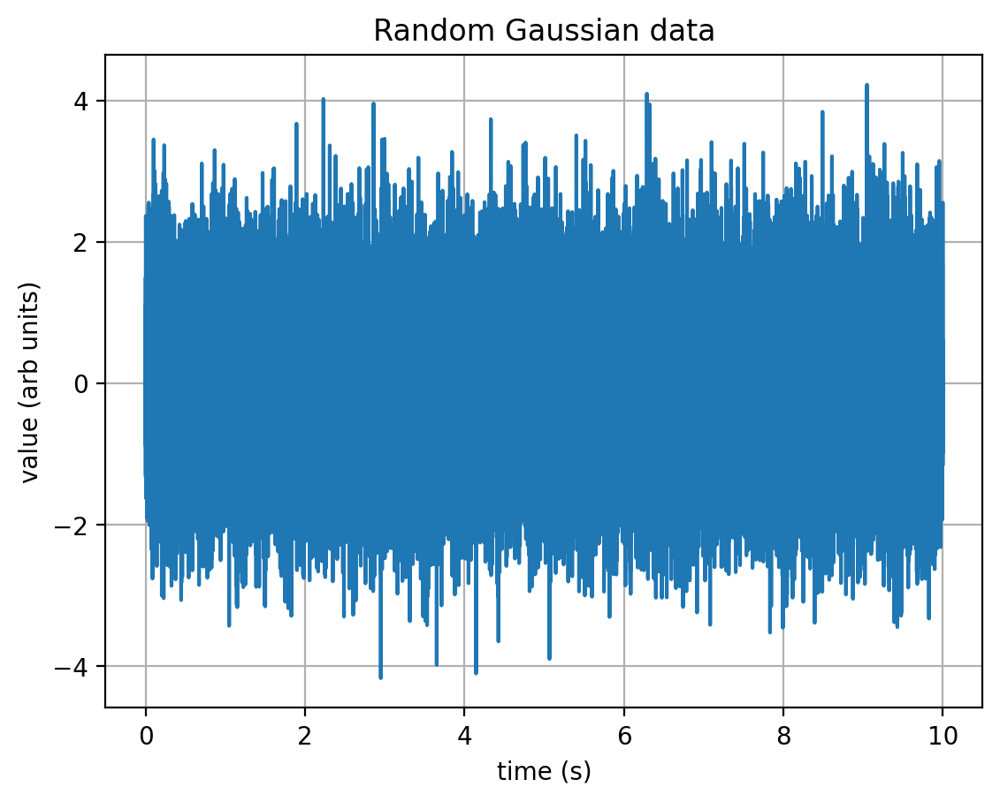

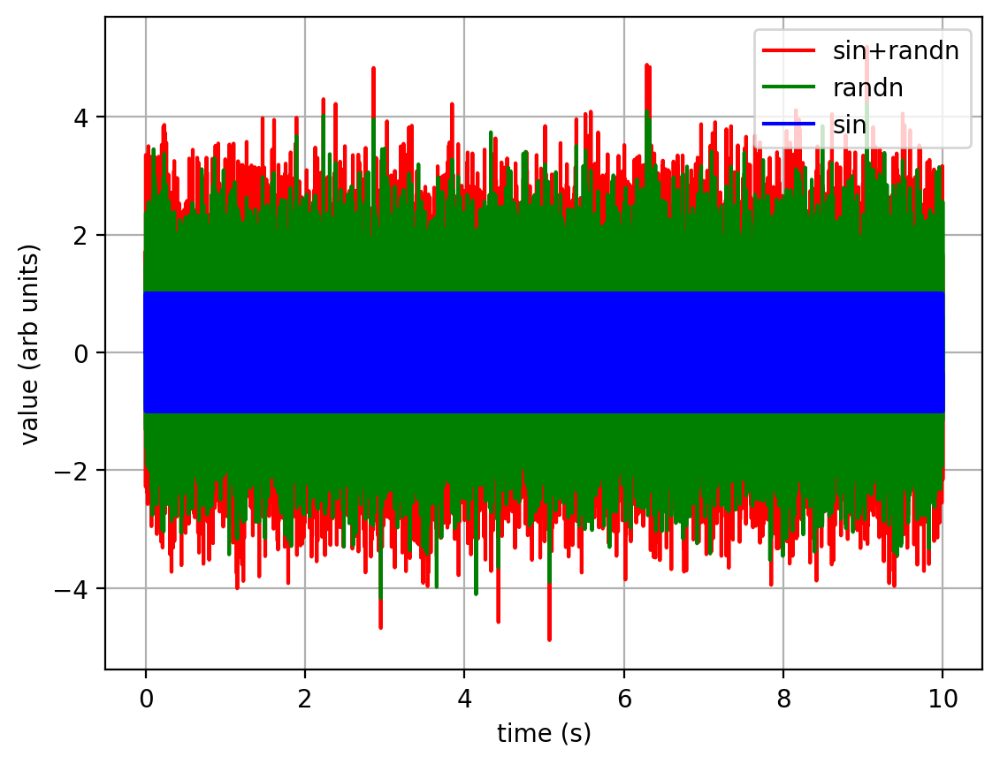

In [75]:
# First generate some sampled data
# define the sample rate
fs = 4096   # [Hz]
# generate a time vector
dt = 1./fs
ttot = 10.  # [sec]
t = np.arange(fs*ttot)*dt
# make a sine wave
f0 = 250.
signal = np.sin(2*np.pi*f0*t)
# make some random Gaussian noise
noise = np.random.randn(t.size)

# plot in time
plt.figure()
plt.plot(t,noise)
plt.xlabel('time (s)')
plt.ylabel('value (arb units)')
plt.grid()
plt.title('Random Gaussian data')

# plot the noise, sine wave, and their sum
strain = signal + noise
plt.figure()
plt.plot(t,strain,'r',label='sin+randn')
plt.plot(t,noise,'g', label='randn')
plt.plot(t,signal,'b',label='sin')
plt.xlabel('time (s)')
plt.ylabel('value (arb units)')
plt.grid()
plt.legend()

### PSD

- Matplotlib提供了一个函数，`psd`，用于估计信号（x）的功率谱密度（Pxx）。这个函数位于 `mlab` 模块中，被描述为 “Welch’s average periodogram method” 。

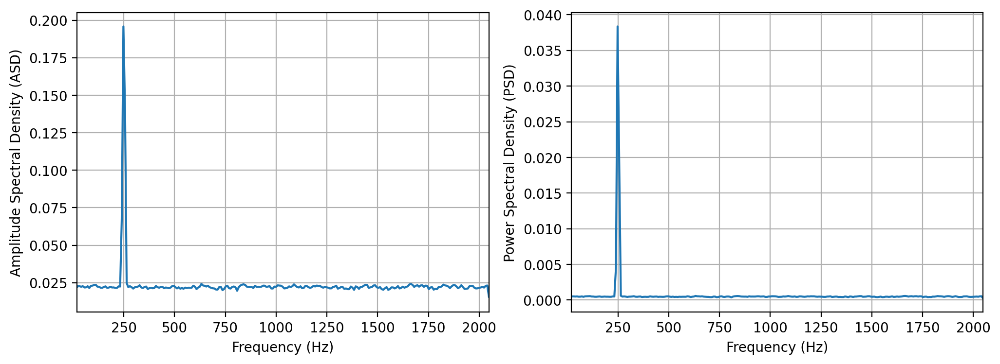

In [76]:
NFFT = fs//8    # 要解析的短时窗口序列的长度 (number of per segment, nperseg)
noverlap = NFFT//2  # 每个相邻短时窗口序列之间的重叠长度 (num of overlap)。一般来说通常取定为 nperseg//2，即 50% 的窗口重叠。

Pxx, freqs = mlab.psd(strain, Fs = fs, NFFT = NFFT, noverlap=NFFT//2)

plt.figure(figsize=(12, 4))
plt.subplot(1,2,1)
plt.plot(freqs, np.sqrt(Pxx))
plt.xlim([20.,fs/2.])
plt.grid()
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude Spectral Density (ASD)');

plt.subplot(1,2,2)
plt.plot(freqs, Pxx)
plt.xlim([20.,fs/2.])
plt.grid()
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density (PSD)');

- 我们尝试复现一下 `mlab.psd`，以深刻理解数据到底是怎么处理的。
    - 默认参数：汉宁窗、one-sided
    - 注：strain.size 的采样点数目是偶数

In [77]:
NFFT = nperseg = fs//8    # 要解析的短时窗口序列的长度 (number of per segment, nperseg)
noverlap = NFFT//2  # 每个相邻短时窗口序列之间的重叠长度 (num of overlap)。一般来说通常取定为 nperseg//2，即 50% 的窗口重叠。
nstep = NFFT - noverlap  # 间接计算出来的参数 (num of step)，为了之后计算窗口滑动数目带来便利。
win = np.hanning(NFFT)   # 对每个短时窗口序列加窗

# onesided
numFreqs = NFFT//2 + 1  # 由于 NFFT 是偶数
scaling_factor = 2.

NFFT, noverlap, nstep, win.size

(512, 256, 256, 512)

In [79]:
# 此时就可以把 freqs 坐标结果先算出来
freqs_scratch = np.fft.fftfreq(NFFT, 1/fs)[:numFreqs]

# get the last value correctly, it is negative otherwise
freqs_scratch[-1] *= -1
freqs_scratch.shape

(257,)

In [80]:
# Check
np.alltrue(freqs == freqs_scratch)

True

<img src="https://cdn.sa.net/2023/12/14/ziQexslVy7kPvLf.jpg" style="width:600px;height:auto;">

In [85]:
# 对 strain 数据进行切片
slices = [ (i*nstep , i*nstep+nperseg)
          for i in range(strain.size)
          if i*nstep+nperseg <= strain.size ]
result = np.asarray([strain[s[0]:s[1]] for s in slices])  # (159, 512) => (time, freq)

# Apply window by multiplication
result *= win  # (159, 512) x (512,)

# Perform the fft.
# 1-D *nfft*-point discrete Fourier Transform (DFT) of a real-valued array 
# result = scipy.fft.rfft(result.real, n=nfft)[:,:numFreqs]
result = np.fft.fft(result, n=NFFT)[:,:numFreqs]

result = np.conj(result) * result  # 取模平方 = | |^2

# Also include scaling factors for one-sided densities and dividing by
# the sampling frequency, if desired. Scale everything, except the DC
# component and the NFFT/2 component:
slc = slice(1, -1, None)
result[:,slc] *= scaling_factor

# The resulting density values should be scaled by the scaling
#     frequency, which gives density in units of 1/Hz.  This allows for
#     integration over the returned frequency values.  The default is True for
#     MATLAB compatibility.
result /= fs  # You know why...

# Energy correction.
# Scale the spectrum by the norm of the window to compensate for
# windowing loss; see Bendat & Piersol Sec 11.5.2.
result /= (win**2).sum()
result.shape

(159, 257)

>It should be mentioned that the **loss factor** can be computed directly from
>
>$$\frac{\int_0^T u_h^2(t) d t}{\int_0^T u^2(t) d t}$$
>where $u_h(t)$ is your window function and $u(t)$ is a rectangular time window.
>
>Hence, one should multiply your windowed DFT by the scale factor `1/loss_factor` to obtain the correct magnitudes in later spectral density estimates.
>——Bendat & Piersol Sec 11.5.2


<details>
  <summary>点击折叠/展开</summary>

- Assert Parseval’s for different windowing functions
    
REF: 
- https://xrft.readthedocs.io/en/latest/Parseval_example.html
- https://dsp.stackexchange.com/questions/58976/comparison-of-results-own-implementation-and-python-signal-welch
- https://jp.mathworks.com/matlabcentral/answers/372516-calculate-windowing-correction-factor


> Comment from `xrft`.
>
>Depending on the `scaling` flag, a different correction is applied to the windowed spectrum:
>
>1. `scaling='density'`: **Energy correction** - this corrects for the energy (integral) of the spectrum. 
>It is typically applied to the power spectral density (including cross power spectral density) and rescales the spectrum by `1.0 / (window**2).mean()`.
>It ensures that the integral of the spectral density (approximately) matches the RMS^2 of the signal (i.e. that Parseval’s theorem is satisfied).
>
>2. `scaling='spectrum'`: **Amplitude correction** - this corrects the amplitude of peaks in the spectrum and rescales the spectrum by `1.0 / window.mean()**2`.
>It is typically applied to the power spectrum (i.e. not density) and is most useful in strongly periodic signals.
>It ensures, for example, that the peak in the power spectrum of a 300 Hz sine wave with RMS^2 = 200 has a magnitude of 200.
>
>These scalings replicate the default behaviour of scipy spectral functions like scipy.signal.periodogram and scipy.signal.welch (cf. Section 11.5.2. of Bendat & Piersol, 2011; Section 10.3 of Brandt, 2011).
  
</details>


In [87]:
# 手撸 one-sided PSD
Pxx_scratch = result.mean(axis=0).real
Pxx_scratch.shape

(257,)

In [89]:
# Check
np.alltrue(Pxx == Pxx_scratch)

True

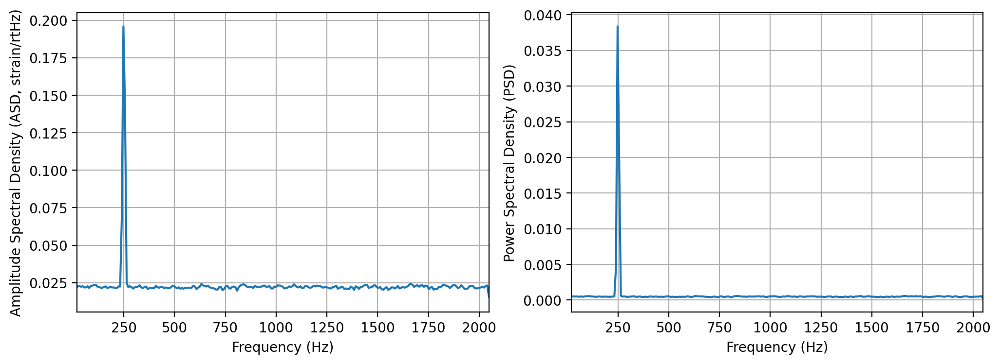

In [90]:
# Check
plt.figure(figsize=(12, 4))
plt.subplot(1,2,1)
plt.plot(freqs_scratch, np.sqrt(Pxx_scratch))
plt.xlim([20.,fs/2.])
plt.grid()
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude Spectral Density (ASD, strain/rtHz)');

plt.subplot(1,2,2)
plt.plot(freqs_scratch, Pxx_scratch)
plt.xlim([20.,fs/2.])
plt.grid()
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density (PSD)');

我们把默认参数下的手撸代码打包为一个 `spectral_helper` 函数：

In [91]:
def spectral_helper(strain, fs, NFFT, noverlap):
    nperseg = NFFT
    nstep = NFFT - noverlap  # 间接计算出来的参数 (num of step)，为了之后计算窗口滑动数目带来便利。
    win = np.hanning(NFFT)   # 对每个短时窗口序列加窗

    # onesided
    numFreqs = NFFT//2 + 1  # 由于 NFFT 是偶数
    scaling_factor = 2.


    # onesided
    numFreqs = NFFT//2 + 1  # 由于 NFFT 是偶数
    scaling_factor = 2.


    # 对 strain 数据进行切片
    slices = [ (i*nstep , i*nstep+nperseg)
              for i in range(strain.size)
              if i*nstep+nperseg <= strain.size ]
    result = np.asarray([strain[s[0]:s[1]] for s in slices])  # (159, 512) => (time, freq)

    # Apply window by multiplication
    result *= win  # (159, 512) x (512,)

    # Perform the fft.
    # 1-D *nfft*-point discrete Fourier Transform (DFT) of a real-valued array 
    # result = scipy.fft.rfft(result.real, n=nfft)[:,:numFreqs]
    result = np.fft.fft(result, n=NFFT)[:,:numFreqs]

    result = np.conj(result) * result  # 取模平方 = | |^2

    # Also include scaling factors for one-sided densities and dividing by
    # the sampling frequency, if desired. Scale everything, except the DC
    # component and the NFFT/2 component:
    slc = slice(1, -1, None)
    result[:,slc] *= scaling_factor

    # The resulting density values should be scaled by the scaling
    #     frequency, which gives density in units of 1/Hz.  This allows for
    #     integration over the returned frequency values.  The default is True for
    #     MATLAB compatibility.
    result /= fs  # You know why...

    # Energy correction.
    # Scale the spectrum by the norm of the window to compensate for
    # windowing loss; see Bendat & Piersol Sec 11.5.2.
    result /= (win**2).sum()
    return result

result = spectral_helper(strain, fs, NFFT, noverlap)

# 手撸 one-sided PSD
Pxx_scratch = result.mean(axis=0).real

# Check
np.alltrue(Pxx == Pxx_scratch)

True

### Specgram

- Short time-frequency spectrogram

(257, 159)

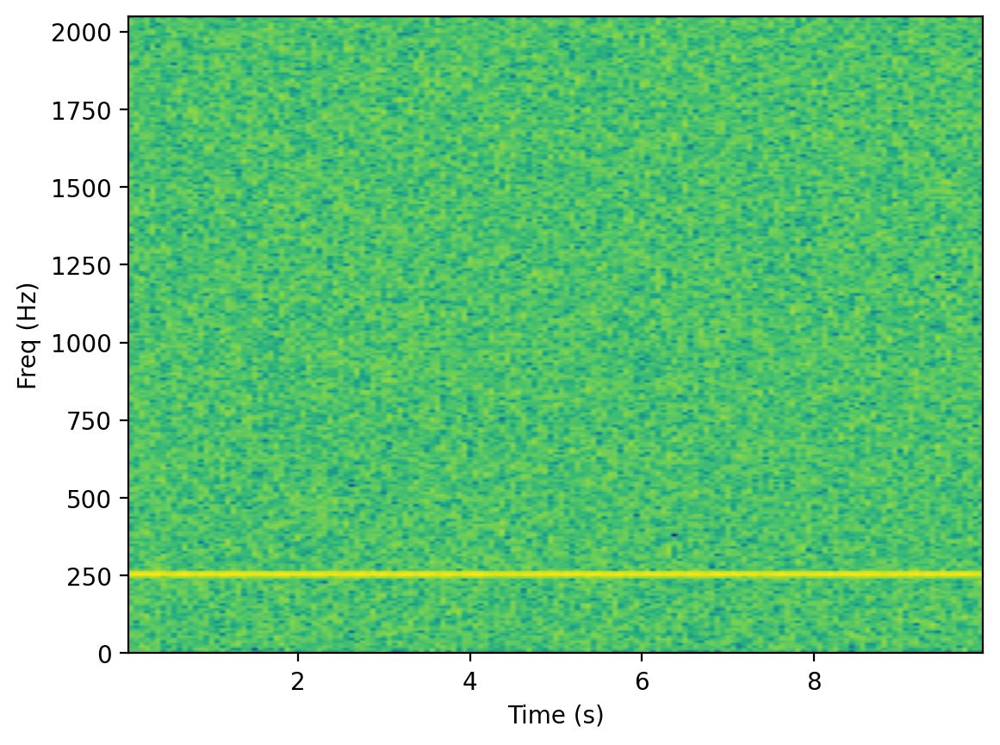

In [92]:
spec, freqs, bins, im = plt.specgram(strain, Fs = fs, NFFT = NFFT, noverlap=noverlap)
plt.xlabel('Time (s)')
plt.ylabel('Freq (Hz)')

spec.shape

In [93]:
spec_scratch = spectral_helper(strain, fs, NFFT, noverlap).real
spec_scratch.shape

(159, 257)

In [94]:
# Check
np.alltrue(spec.T == spec_scratch)

True

## Plot the Amplitude Spectral Density (ASD)

Plotting these data in the Fourier domain gives us an idea of the frequency content of the data. A way to visualize the frequency content of the data is to plot the amplitude spectral density, ASD.

The ASDs are the square root of the power spectral densities (PSDs), which are averages of the square of the fast fourier transforms (FFTs) of the data.

They are an estimate of the "strain-equivalent noise" of the detectors versus frequency, which limit the ability of the detectors to identify GW signals.

They are in units of strain/rt(Hz). So, if you want to know the root-mean-square (rms) strain noise in a frequency band, integrate (sum) the squares of the ASD over that band, then take the square-root.

There's a signal in these data! For the moment, let's ignore that, and assume it's all noise.

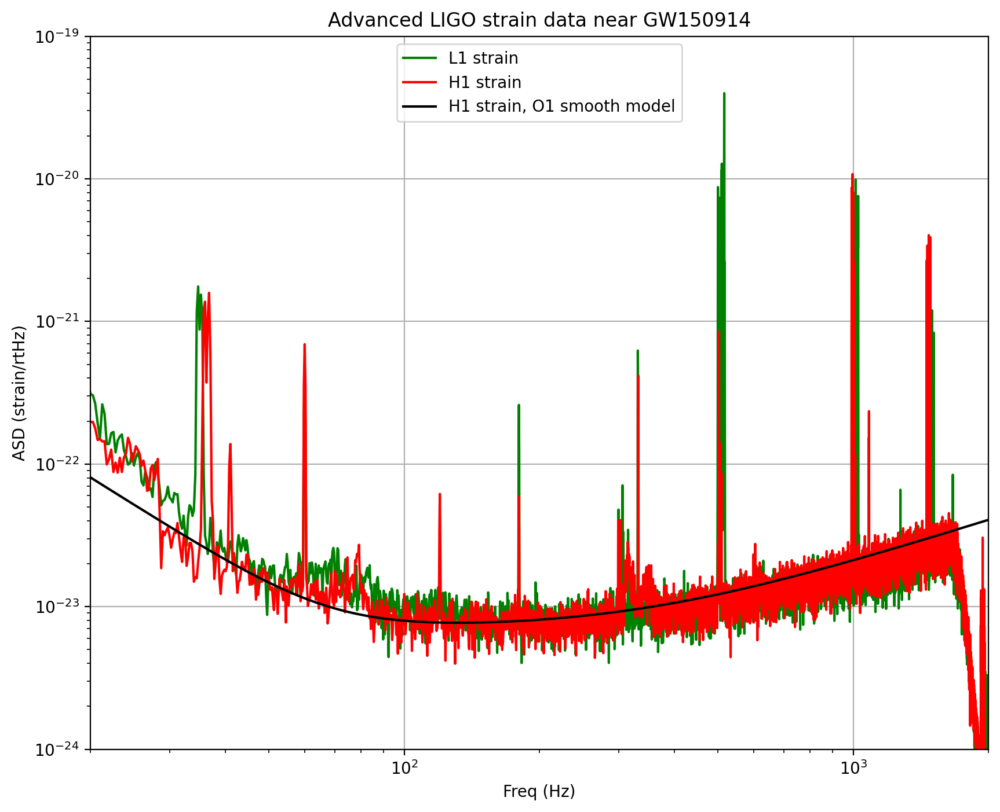

In [95]:
make_psds = 1
if make_psds:
    # number of sample for the fast fourier transform:
    NFFT = 4*fs
    Pxx_H1, freqs = mlab.psd(strain_H1, Fs = fs, NFFT = NFFT)
    Pxx_L1, freqs = mlab.psd(strain_L1, Fs = fs, NFFT = NFFT)

    # We will use interpolations of the ASDs computed above for whitening:
    psd_H1 = interp1d(freqs, Pxx_H1)
    psd_L1 = interp1d(freqs, Pxx_L1)

    # Here is an approximate, smoothed PSD for H1 during O1, with no lines. We'll use it later.    
    Pxx = (1.e-22*(18./(0.1+freqs))**2)**2+0.7e-23**2+((freqs/2000.)*4.e-23)**2
    psd_smooth = interp1d(freqs, Pxx)

if make_plots:
    # plot the ASDs, with the template overlaid:
    f_min = 20.
    f_max = 2000. 
    plt.figure(figsize=(10,8))
    plt.loglog(freqs, np.sqrt(Pxx_L1),'g',label='L1 strain')
    plt.loglog(freqs, np.sqrt(Pxx_H1),'r',label='H1 strain')
    plt.loglog(freqs, np.sqrt(Pxx),'k',label='H1 strain, O1 smooth model')
    plt.axis([f_min, f_max, 1e-24, 1e-19])
    plt.grid('on')
    plt.ylabel('ASD (strain/rtHz)')
    plt.xlabel('Freq (Hz)')
    plt.legend(loc='upper center')
    plt.title('Advanced LIGO strain data near '+eventname)
    # plt.savefig(eventname+'_ASDs.'+plottype)


NOTE that we only plot the data between f_min = 20 Hz and f_max = 2000 Hz.

Below f_min, the data are **not properly calibrated**. That's OK, because the noise is so high below f_min that LIGO cannot sense gravitational wave strain from astrophysical sources in that band.

The sample rate is fs = 4096 Hz (2^12 Hz), so the data cannot capture frequency content above the Nyquist frequency = fs/2 = 2048 Hz. That's OK, because our events only have detectable frequency content in the range given by fband, defined above; the upper end will (almost) always be below the Nyquist frequency. We set f_max = 2000, a bit below Nyquist.

You can see strong spectral lines in the data; they are all of instrumental origin. Some are engineered into the detectors (mirror suspension resonances at ~500 Hz and harmonics, calibration lines, control dither lines, etc) and some (60 Hz and harmonics) are unwanted. We'll return to these, later.

You can't see the signal in this plot, since it is relatively weak and less than a second long, while this plot averages over 32 seconds of data. So this plot is entirely dominated by instrumental noise.

The smooth model is hard-coded and tuned by eye; it won't be right for arbitrary times. We will only use it below for things that don't require much accuracy.



## Whitening + bandpass

From the ASD above, we can see that the data are very strongly "colored" - noise fluctuations are much larger at low and high frequencies and near spectral lines, reaching a roughly flat ("white") minimum in the band around 80 to 300 Hz.

We can "whiten" the data (dividing it by the noise amplitude spectrum, in the fourier domain), suppressing the extra noise at low frequencies and at the spectral lines, to better see the weak signals in the most sensitive band.

Whitening is always one of the first steps in astrophysical data analysis (searches, parameter estimation). Whitening requires no prior knowledge of spectral lines, etc; only the data are needed.

To get rid of remaining high frequency noise, we will also bandpass the data.

The resulting time series is no longer in units of strain; now in units of "sigmas" away from the mean.

We will plot the whitened strain data, along with the signal template, after the matched filtering section, below.

In [96]:
# function to whiten data
def whiten(strain, interp_psd, dt):
    Nt = len(strain)
    freqs = np.fft.rfftfreq(Nt, dt)
    freqs1 = np.linspace(0,2048,Nt//2+1)

    # whitening: transform to freq domain, divide by asd, then transform back, 
    # taking care to get normalization right.
    hf = np.fft.rfft(strain)
    norm = 1./np.sqrt(1./(dt*2))
    white_hf = hf / np.sqrt(interp_psd(freqs)) * norm
    white_ht = np.fft.irfft(white_hf, n=Nt)
    return white_ht

whiten_data = 1
if whiten_data:
    # now whiten the data from H1 and L1, and the template (use H1 PSD):
    strain_H1_whiten = whiten(strain_H1,psd_H1,dt)
    strain_L1_whiten = whiten(strain_L1,psd_L1,dt)
    
    # We need to suppress the high frequency noise (no signal!) with some bandpassing:
    bb, ab = butter(4, [fband[0]*2./fs, fband[1]*2./fs], btype='band')
    normalization = np.sqrt((fband[1]-fband[0])/(fs/2))
    strain_H1_whitenbp = filtfilt(bb, ab, strain_H1_whiten) / normalization
    strain_L1_whitenbp = filtfilt(bb, ab, strain_L1_whiten) / normalization

In [98]:
fband

[43.0, 300.0]

The event at 1126259462.44


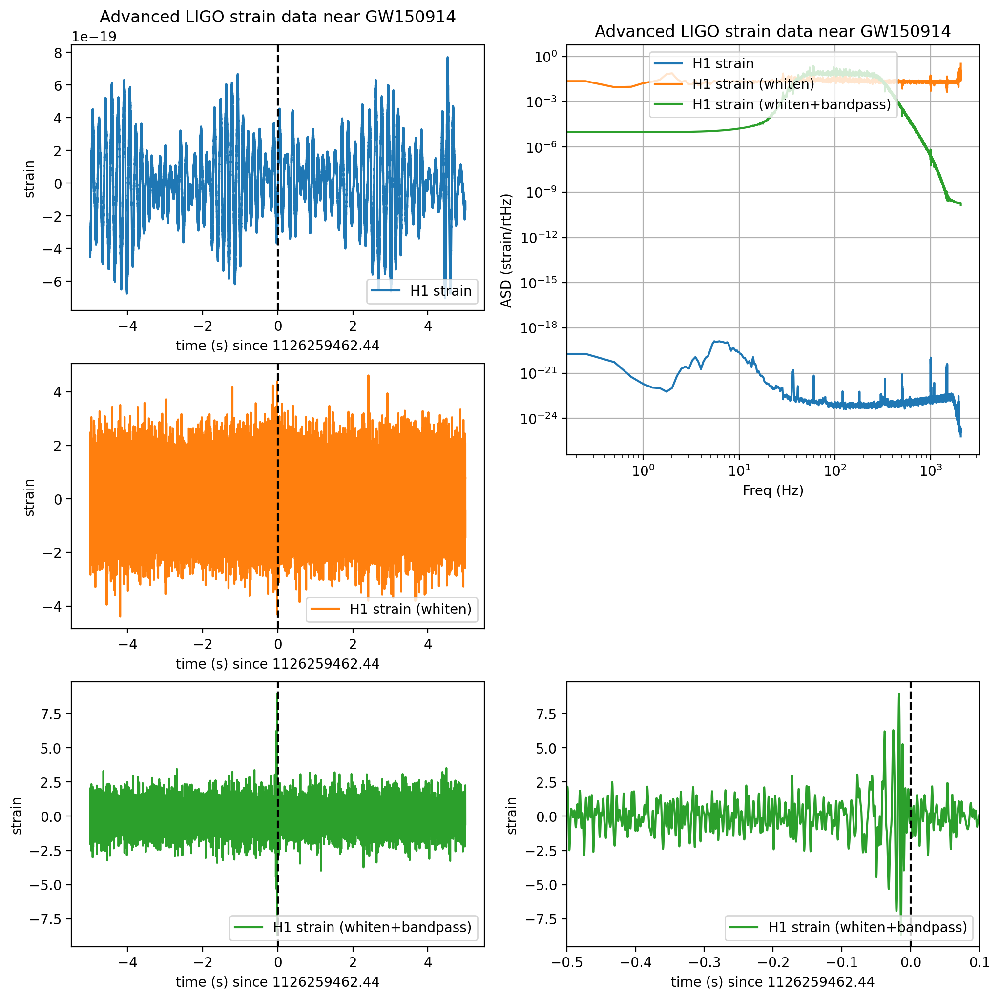

In [97]:
# plot +- deltat seconds around the event:
# index into the strain time series for this time interval:
deltat = 5
indxt = np.where((time >= tevent-deltat) & (time < tevent+deltat))  # 切片 GW150914 附近 ± 5秒的索引
print('The event at', tevent)

colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

plt.figure(figsize=(12,12))
for idx, (strain_type, text) in enumerate(zip([strain_H1, strain_H1_whiten, strain_H1_whitenbp],
                               ['', ' (whiten)', ' (whiten+bandpass)'])):
    plt.subplot(3,2,(idx*2+1))
    plt.plot(time[indxt]-tevent, strain_type[indxt],f'{colors[idx]}',label='H1 strain'+text)
    plt.axvline(0, color='k', ls='--')
    plt.ylabel('strain')
    plt.legend(loc='lower right')
    if idx==0:
        plt.title('Advanced LIGO strain data near '+eventname)
    plt.xlabel('time (s) since '+str(tevent))

    plt.subplot(2,2,2)
    Pxx_type, freqs = mlab.psd(strain_type, Fs = fs, NFFT = NFFT)
    plt.loglog(freqs, np.sqrt(Pxx_type),f'{colors[idx]}',label='H1 strain'+text)
    # plt.axis([f_min, f_max, 1e-24, 1e-19])
    plt.grid('on')
    plt.ylabel('ASD (strain/rtHz)')
    plt.xlabel('Freq (Hz)')
    plt.legend(loc='upper center')
    plt.title('Advanced LIGO strain data near '+eventname)
    
plt.subplot(3,2,6)
plt.plot(time[indxt]-tevent, strain_type[indxt],f'{colors[idx]}',label='H1 strain'+text)
plt.axvline(0, color='k', ls='--')
plt.ylabel('strain')
plt.legend(loc='lower right')
plt.xlabel('time (s) since '+str(tevent))
plt.xlim(-0.5,0.1);

## Spectrograms

Now let's plot a short time-frequency spectrogram around our event:

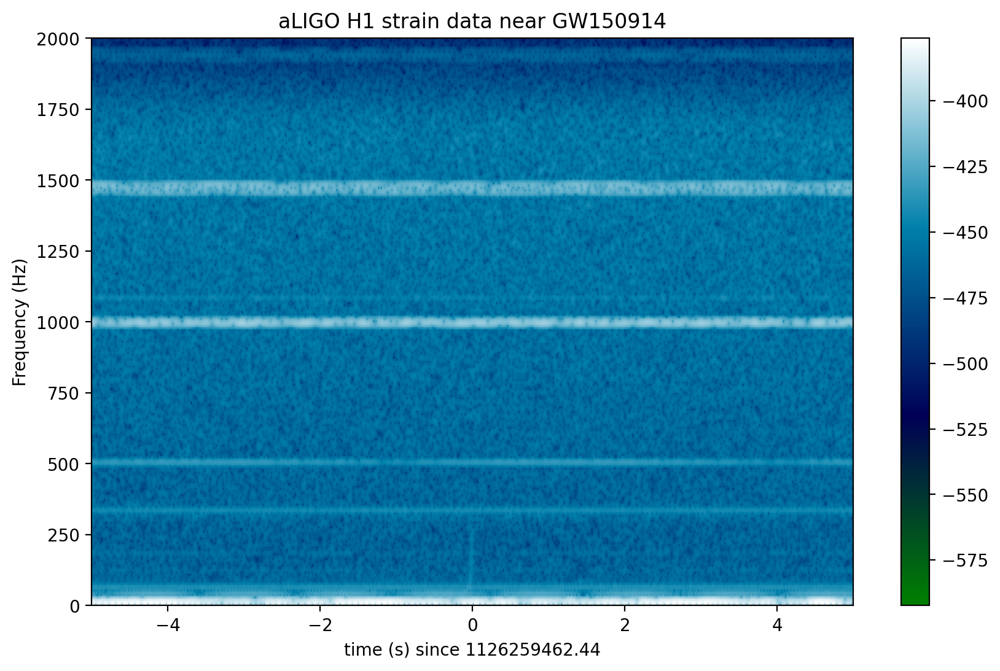

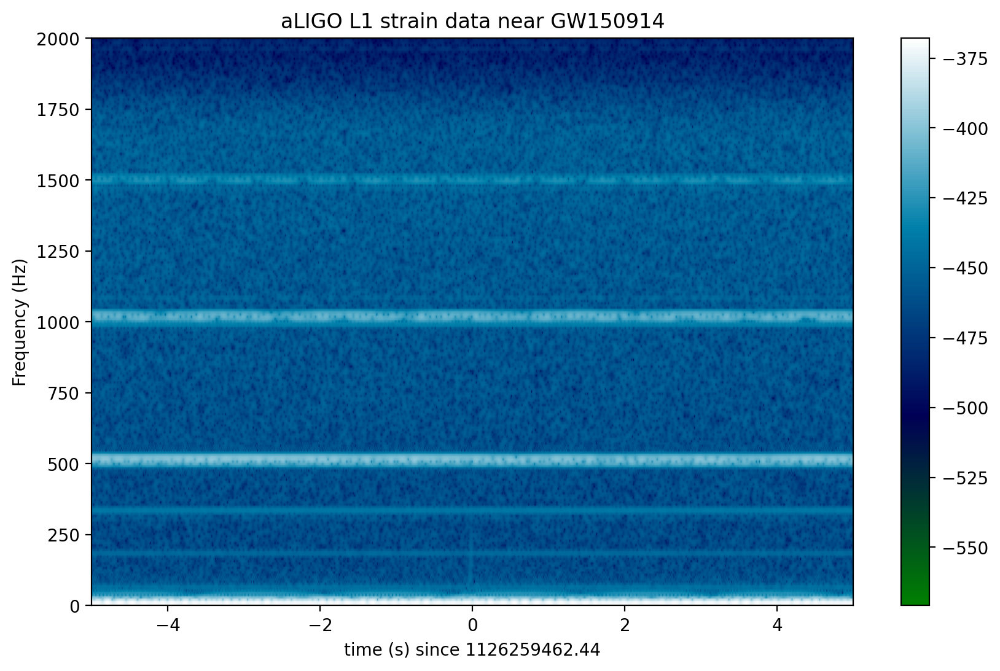

In [99]:
if make_plots:
    # index into the strain time series for this time interval:
    indxt = np.where((time >= tevent-deltat) & (time < tevent+deltat))

    # pick a shorter FTT time interval, like 1/8 of a second:
    NFFT = int(fs/8)
    # and with a lot of overlap, to resolve short-time features:
    NOVL = int(NFFT*15./16)
    # and choose a window that minimizes "spectral leakage" 
    # (https://en.wikipedia.org/wiki/Spectral_leakage)
    window = np.blackman(NFFT)

    # the right colormap is all-important! See:
    # http://matplotlib.org/examples/color/colormaps_reference.html
    # viridis seems to be the best for our purposes, but it's new; if you don't have it, you can settle for ocean.
    #spec_cmap='viridis'
    spec_cmap='ocean'

    # Plot the H1 spectrogram:
    plt.figure(figsize=(10,6))
    spec_H1, freqs, bins, im = plt.specgram(strain_H1[indxt], NFFT=NFFT, Fs=fs, window=window, 
                                            noverlap=NOVL, cmap=spec_cmap, xextent=[-deltat,deltat])
    plt.xlabel('time (s) since '+str(tevent))
    plt.ylabel('Frequency (Hz)')
    plt.colorbar()
    plt.axis([-deltat, deltat, 0, 2000])
    plt.title('aLIGO H1 strain data near '+eventname)
    # plt.savefig(eventname+'_H1_spectrogram.'+plottype)

    # Plot the L1 spectrogram:
    plt.figure(figsize=(10,6))
    spec_H1, freqs, bins, im = plt.specgram(strain_L1[indxt], NFFT=NFFT, Fs=fs, window=window, 
                                            noverlap=NOVL, cmap=spec_cmap, xextent=[-deltat,deltat])
    plt.xlabel('time (s) since '+str(tevent))
    plt.ylabel('Frequency (Hz)')
    plt.colorbar()
    plt.axis([-deltat, deltat, 0, 2000])
    plt.title('aLIGO L1 strain data near '+eventname)
    # plt.savefig(eventname+'_L1_spectrogram.'+plottype)


In the above spectrograms, you may see lots of excess power below ~20 Hz, as well as strong spectral lines at 500, 1000, 1500 Hz (also evident in the ASDs above).

The lines at multiples of 500 Hz are the harmonics of the "violin modes" of the fibers holding up the mirrors of the Advanced LIGO interferometers.

Now let's zoom in on where we think the signal is, using the whitened data, in the hope of seeing a chirp:

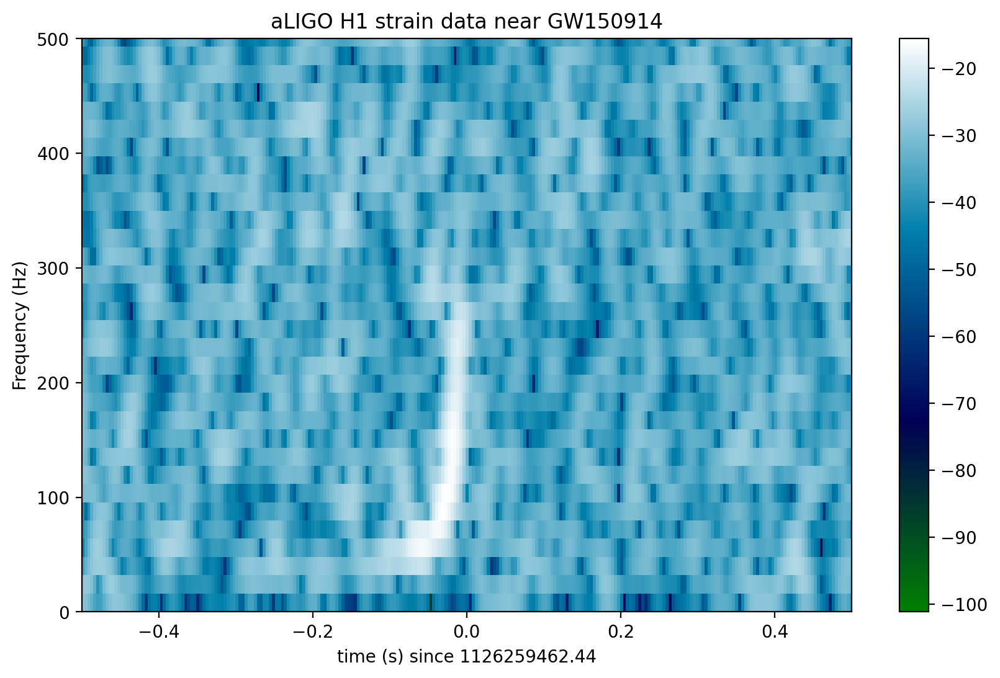

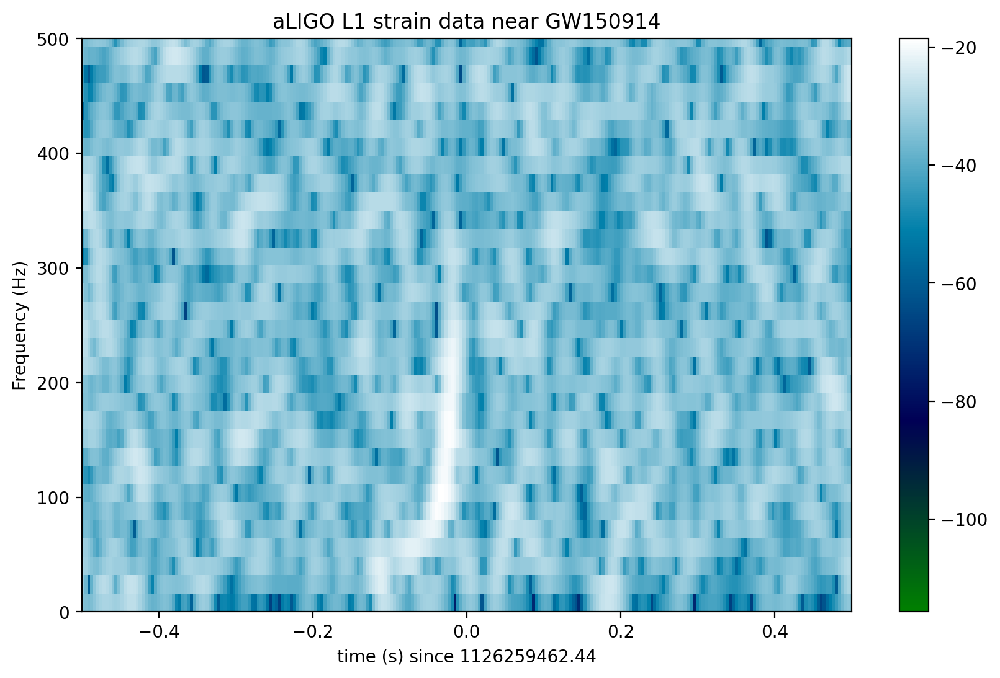

In [100]:
if make_plots:
    #  plot the whitened data, zooming in on the signal region:

    # pick a shorter FTT time interval, like 1/16 of a second:
    NFFT = int(fs/16.0)
    # and with a lot of overlap, to resolve short-time features:
    NOVL = int(NFFT*15/16.0)
    # choose a window that minimizes "spectral leakage" 
    # (https://en.wikipedia.org/wiki/Spectral_leakage)
    window = np.blackman(NFFT)

    # Plot the H1 whitened spectrogram around the signal
    plt.figure(figsize=(10,6))
    spec_H1, freqs, bins, im = plt.specgram(strain_H1_whiten[indxt], NFFT=NFFT, Fs=fs, window=window, 
                                            noverlap=NOVL, cmap=spec_cmap, xextent=[-deltat,deltat])
    plt.xlabel('time (s) since '+str(tevent))
    plt.ylabel('Frequency (Hz)')
    plt.colorbar()
    plt.axis([-0.5, 0.5, 0, 500])
    plt.title('aLIGO H1 strain data near '+eventname)
    # plt.savefig(eventname+'_H1_spectrogram_whitened.'+plottype)

    # Plot the L1 whitened spectrogram around the signal
    plt.figure(figsize=(10,6))
    spec_H1, freqs, bins, im = plt.specgram(strain_L1_whiten[indxt], NFFT=NFFT, Fs=fs, window=window, 
                                            noverlap=NOVL, cmap=spec_cmap, xextent=[-deltat,deltat])
    plt.xlabel('time (s) since '+str(tevent))
    plt.ylabel('Frequency (Hz)')
    plt.colorbar()
    plt.axis([-0.5, 0.5, 0, 500])
    plt.title('aLIGO L1 strain data near '+eventname)
    # plt.savefig(eventname+'_L1_spectrogram_whitened.'+plottype)

Loud (high SNR) signals may be visible in these spectrograms. 

Compact object mergers show a characteristic "chirp" as the signal rises in frequency. 

## Waveform Template

The results of a full LIGO-Virgo analysis of this BBH event include a set of parameters that are consistent with a range of parameterized waveform templates. Here we pick one for use in matched filtering.

As noted above, the results won't be identical to what is in the LIGO-Virgo papers, since we're skipping many subtleties, such as combining many consistent templates.

In [101]:
# read in the template (plus and cross) and parameters for the theoretical waveform
try:
    f_template = h5py.File('LOSC_Event_tutorial/'+fn_template, "r")
except:
    print("Cannot find template file!")
    print("You can download it from https://losc.ligo.org/s/events/"+eventname+'/'+fn_template)
    print("Quitting.")
    # quit()  # kernel restart!
    
# extract metadata from the template file:
template_p, template_c = f_template["template"][...]
t_m1 = f_template["/meta"].attrs['m1']
t_m2 = f_template["/meta"].attrs['m2']
t_a1 = f_template["/meta"].attrs['a1']
t_a2 = f_template["/meta"].attrs['a2']
t_approx = f_template["/meta"].attrs['approx']
f_template.close()
# the template extends to roughly 16s, zero-padded to the 32s data length. The merger will be roughly 16s in.
template_offset = 16.

In [102]:
# whiten the templates:
template_p_whiten = whiten(template_p,psd_H1,dt)
template_c_whiten = whiten(template_c,psd_H1,dt)
template_p_whitenbp = filtfilt(bb, ab, template_p_whiten) / normalization
template_c_whitenbp = filtfilt(bb, ab, template_c_whiten) / normalization

# Compute, print and plot some properties of the template:

# constants:
clight = 2.99792458e8                # m/s
G = 6.67259e-11                      # m^3/kg/s^2 
MSol = 1.989e30                      # kg

# template parameters: masses in units of MSol:
t_mtot = t_m1+t_m2
# final BH mass is typically 95% of the total initial mass:
t_mfin = t_mtot*0.95

# Final BH radius, in km:
# 计算最终黑洞半径。
# 这里 G 是万有引力常数，t_mfin 是最终黑洞的质量（以太阳质量为单位），MSol 是太阳的质量，clight 是光速。
# 这个公式基于广义相对论中的施瓦茨希尔德半径（Schwarzschild radius），用于估算非旋转黑洞的半径。
# 物理上，它代表了黑洞的“事件视界”大小，即从该半径内部逃逸所需的逃逸速度大于光速。
R_fin = 2*G*t_mfin*MSol/clight**2/1000.

# complex template:
template = (template_p + template_c*1.j) 
ttime = time-time[0]-template_offset

# compute the instantaneous frequency of this chirp-like signal:
# 计算引力波的瞬时频率。
# tphase 是信号的相位，fs 是采样频率。
# 物理上，引力波的频率随着两个黑洞的合并过程而变化，这个频率提供了关于合并过程的重要信息。
# 瞬时频率的计算有助于分析引力波信号的特性，如频率随时间的变化。
tphase = np.unwrap(np.angle(template))
fGW = np.gradient(tphase)*fs/(2.*np.pi)
# fix discontinuities at the very end:
# iffix = np.where(np.abs(np.gradient(fGW)) > 100.)[0]
iffix = np.where(np.abs(template) < np.abs(template).max()*0.001)[0]
fGW[iffix] = fGW[iffix[0]-1]
fGW[np.where(fGW < 1.)] = fGW[iffix[0]-1]

# compute v/c:
# 引力波源的轨道速度与光速的比值。
# 这里 t_mtot 是系统的总质量，G 是万有引力常数，MSol 是太阳的质量，fGW 是引力波的频率，clight 是光速。
# 这个公式基于开普勒第三定律的修正形式，用于估算两个黑洞在其轨道上移动的速度。
# 在物理上，这个速度比值提供了关于黑洞合并过程中的动态信息，如系统的能量和动量变化。
voverc = (G*t_mtot*MSol*np.pi*fGW/clight**3)**(1./3.)

# index where f_GW is in-band:
f_inband = fband[0]
iband = np.where(fGW > f_inband)[0][0]
# index at the peak of the waveform:
ipeak = np.argmax(np.abs(template))

# number of cycles between inband and peak:
Ncycles = (tphase[ipeak]-tphase[iband])/(2.*np.pi)

print('Properties of waveform template in {0}'.format(fn_template))
print("Waveform family = {0}".format(t_approx))
print("Masses = {0:.2f}, {1:.2f} Msun".format(t_m1,t_m2))
print('Mtot = {0:.2f} Msun, mfinal = {1:.2f} Msun '.format(t_mtot,t_mfin))
print("Spins = {0:.2f}, {1:.2f}".format(t_a1,t_a2))
print('Freq at inband, peak = {0:.2f}, {1:.2f} Hz'.format(fGW[iband],fGW[ipeak]))
print('Time at inband, peak = {0:.2f}, {1:.2f} s'.format(ttime[iband],ttime[ipeak]))
print('Duration (s) inband-peak = {0:.2f} s'.format(ttime[ipeak]-ttime[iband]))
print('N_cycles inband-peak = {0:.0f}'.format(Ncycles))
print('v/c at peak = {0:.2f}'.format(voverc[ipeak]))
print('Radius of final BH = {0:.0f} km'.format(R_fin))

Properties of waveform template in GW150914_4_template.hdf5
Waveform family = lalsim.SEOBNRv2
Masses = 41.74, 29.24 Msun
Mtot = 70.98 Msun, mfinal = 67.43 Msun 
Spins = 0.35, -0.77
Freq at inband, peak = 43.05, 169.84 Hz
Time at inband, peak = -0.08, -0.02 s
Duration (s) inband-peak = 0.06 s
N_cycles inband-peak = 4
v/c at peak = 0.57
Radius of final BH = 199 km


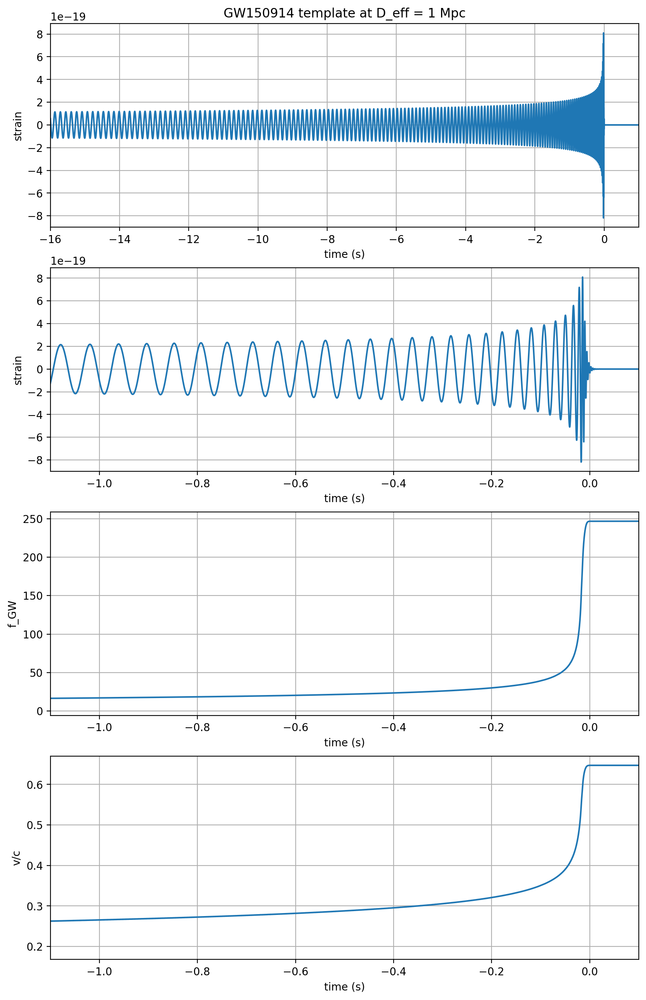

In [103]:
if make_plots:
    plt.figure(figsize=(10,16))
    plt.subplot(4,1,1)
    plt.plot(ttime,template_p)
    plt.xlim([-template_offset,1.])
    plt.grid()
    plt.xlabel('time (s)')
    plt.ylabel('strain')
    plt.title(eventname+' template at D_eff = 1 Mpc')
    
    plt.subplot(4,1,2)
    plt.plot(ttime,template_p)
    plt.xlim([-1.1,0.1])
    plt.grid()
    plt.xlabel('time (s)')
    plt.ylabel('strain')
    
    plt.subplot(4,1,3)
    plt.plot(ttime,fGW)
    plt.xlim([-1.1,0.1])
    plt.grid()
    plt.xlabel('time (s)')
    plt.ylabel('f_GW')
    
    plt.subplot(4,1,4)
    plt.plot(ttime,voverc)
    plt.xlim([-1.1,0.1])
    plt.grid()
    plt.xlabel('time (s)')
    plt.ylabel('v/c')
    # plt.savefig(eventname+'_template.'+plottype)

<img src="LOSC_Event_tutorial/What_are_gravitational_waves.jpg" style="width:1200px;height:auto;">

<img src="LOSC_Event_tutorial/GW_signal.gif" style="width:400px;height:auto;">

## 不得不略过的知识点

由于课时有限，此处已省略相当一部分基于概率与数理统计的理论知识。

- 信号处理的高斯性和稳态性
- 帕塞瓦尔定理 (Parseval's theorem)
    - “傅里叶转换是幺正算符”；简而言之，就是说函数平方的和（或积分）等于其傅里叶转换式平方之和（或者积分）。
- 维纳一辛钦定理（Wiener-Khinchin theorem）
    - 任意一个均值为常数的广义平稳随机过程的功率谱密度是其自相关函数的傅立叶变换。
- 功率谱密度的推导及其重要性质
- 贝叶斯统计的框架下推导理想的探测统计量（optimal detection statistic）

REF：https://iphysresearch.github.io/PhDthesis_html/C2/#23

## 我就是想看看匹配度，整那么多数学干啥？ (Naive 匹配滤波)

别给我扯那么多数学，我就是想看两个数据能不能匹配上？

<img src="LOSC_Event_tutorial/Matched_Filtering_150914.gif" style="width:500px;height:auto;">


### 互相关（Cross-correlation）

在统计学中，互相关有时用来表示两个随机矢量 X 和 Y 之间的协方差cov，以与矢量X 的“协方差”概念相区分，矢量 X 的“协方差”是 X 的各标量成分之间的协方差矩阵。 

在信号处理领域中，互相关是用来表示两个信号之间相似性的一个度量，通常通过与已知信号比较用于寻找未知信号中的特性。

在信号处理领域中, 互相关 (有时也称为 “互协方差”) 是用来表示两个信号之间相似性的一个度量, 通常通过与已知信号比较用于寻找未知信号中的特性。

它是两个信号之间相对于时间的一个函数, 有时也称为 “滑动点积”, 在模式识别以及密码分析学领域都有应用。

对于离散函数 $f_i$ 和 $g_i$ 来说, 互相关定义为
$$
(f \star g)_i \equiv \sum_j f_j^* g_{i+j}
$$

其中和在整个可能的整数 $j$ 区域取和, 星号表示复共轭。对于连续信号 $f(x)$ 和 $g(x)$ 来说, 互相关定义为
$$
(f \star g, x) \equiv \int f^*(t) g(x+t) d t
$$

其中积分是在整个可能的 $t$ 区域积分。
互相关实质上类似于两个函数的卷积。

In [110]:
from  tqdm import tqdm
def correlation_scratch(strain, template):
    result = np.zeros_like(strain)
    for i in tqdm(range(len(strain))):
        result[i] = np.dot(np.roll(np.append(template, np.zeros(template.size//2)),
                                   -template.size//2+i)[:strain.size], strain)
    return result


<img src="https://cdn.sa.net/2023/12/15/4Bvi7cQtbphVNFA.jpg" style="width:500px;height:auto;">  。。。

In [111]:
win = np.hanning(strain_H1_whitenbp.size)
# 数据
strain_scratch = strain_H1_whitenbp * win

# 模板
template_scratch = template_p_whitenbp * win

strain_scratch.shape, template_scratch.shape

((131072,), (131072,))

In [112]:
corr_scratch = correlation_scratch(strain_scratch, template_scratch)
corr_scratch.shape

100%|██████████| 131072/131072 [01:04<00:00, 2038.50it/s]


(131072,)

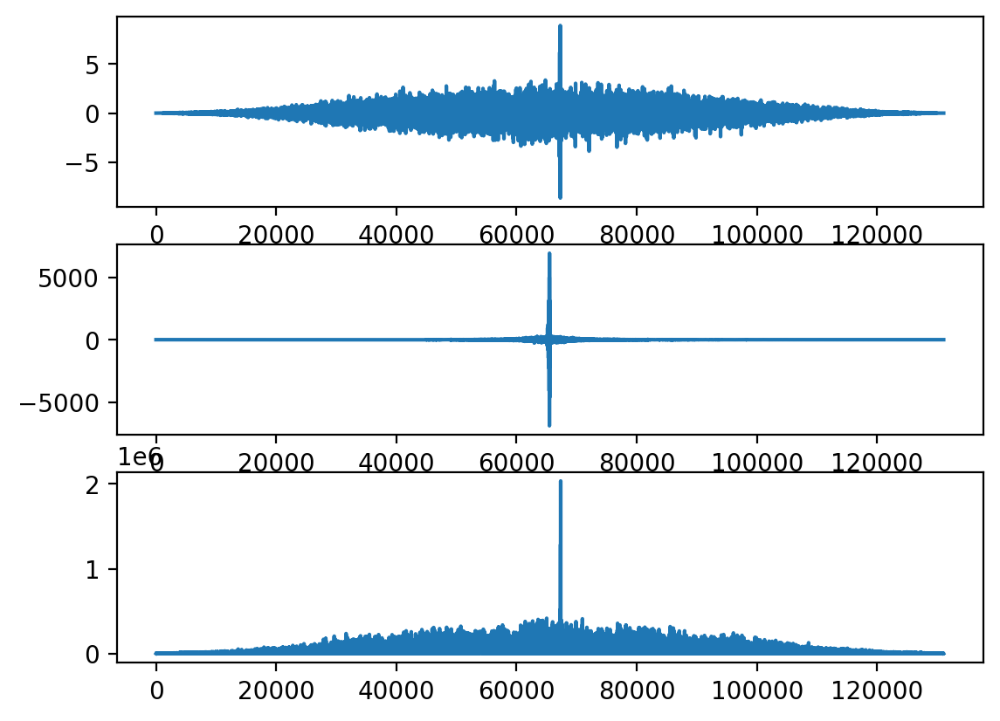

In [113]:
plt.subplot(3,1,1)
plt.plot(strain_scratch)
plt.subplot(3,1,2)
plt.plot(template_scratch)
plt.subplot(3,1,3)
plt.plot(abs(corr_scratch))

(65000.0, 68000.0)

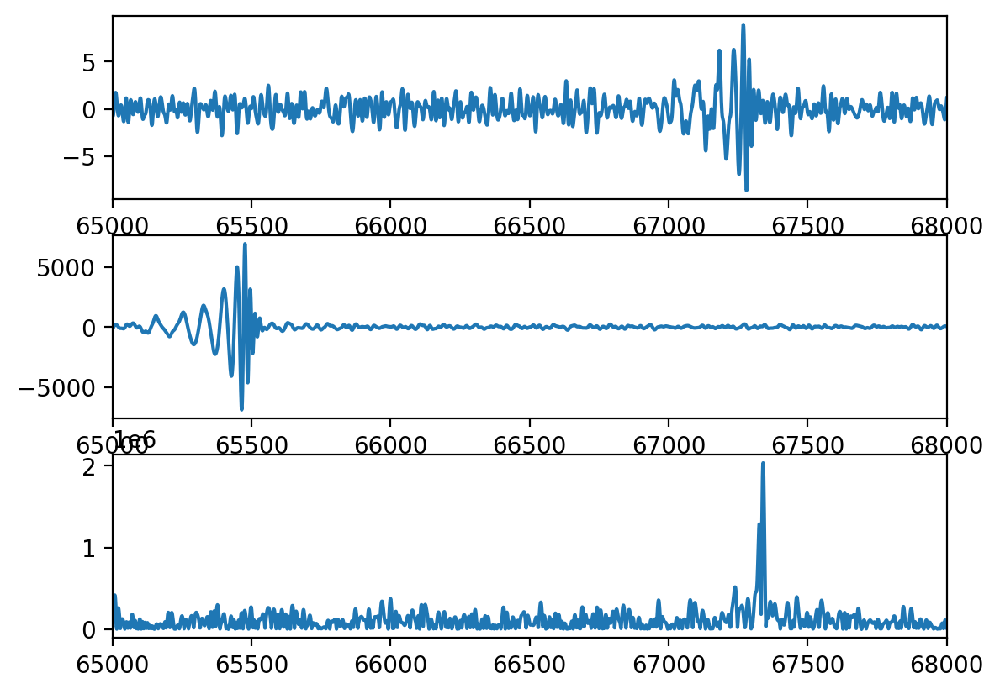

In [114]:
plt.subplot(3,1,1)
plt.plot(strain_scratch)
plt.xlim(6.5e4,6.8e4)
plt.subplot(3,1,2)
plt.plot(template_scratch)
plt.xlim(6.5e4,6.8e4)
plt.subplot(3,1,3)
plt.plot(abs(corr_scratch))
plt.xlim(6.5e4,6.8e4)

In [115]:
index_slic_argmax = np.argmax(abs(corr_scratch))
index_slic_argmax

67340

(65000.0, 68000.0)

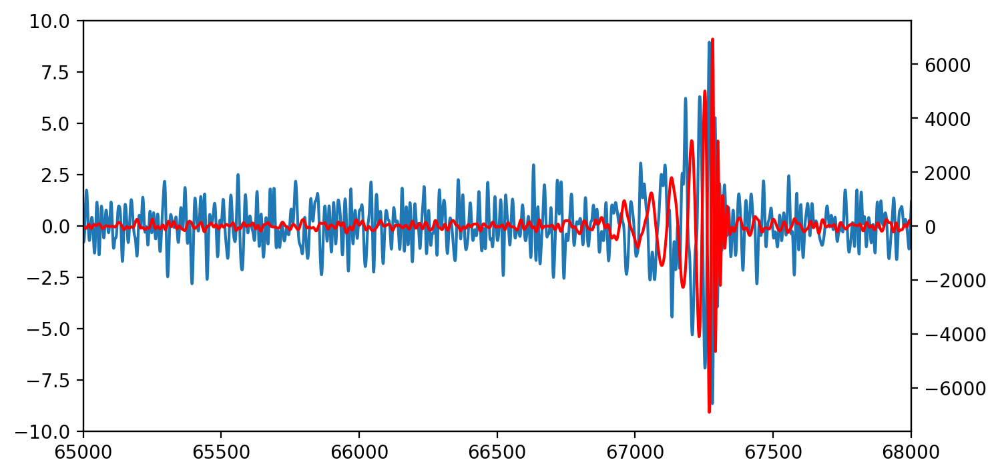

In [116]:
i = index_slic_argmax

plt.figure(figsize=(8,4))
plt.plot(strain_scratch)
plt.ylim(-10,10)
template_scratch_rolled = np.roll(np.append(template_scratch, np.zeros(template_scratch.size//2)),
                                     -template_scratch.size//2+i)[:strain_scratch.size]
plt.twinx()
plt.plot(template_scratch_rolled, 'r')
plt.xlim(6.5e4,6.8e4)

> Note: 这是非常粗略的一种利用模板做相关性匹配找信号的演示。

In [117]:
# Check
np.abs(np.dot(template_scratch_rolled , strain_scratch))

2035182.2367850973

In [118]:
# Check
max(abs(corr_scratch))

2035182.2367850973

In [119]:
# Numpy
# Cross-correlation of two 1-dimensional sequences.
corr_numpy = np.correlate(strain_scratch, template_scratch, mode='same')

# Check
np.allclose(corr_scratch, corr_numpy)

True

In [120]:
# Scipy
# Cross-correlate two N-dimensional arrays.
corr_scipy = scipy.signal.correlate(strain_scratch, template_scratch, mode='same')

# Check
np.allclose(corr_scratch, corr_scipy)

True

In [121]:
%timeit np.correlate(strain_scratch, template_scratch, mode='same')
%timeit scipy.signal.correlate(strain_scratch, template_scratch, mode='same')

1.83 s ± 9.74 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
10.7 ms ± 5.79 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


### 卷积（Convolution）

在泛函分析中，卷积，或译为叠积、褶积或旋积，是透过两个函数和生成第三个函数的一种数学算子，表征函数与经过翻转和平移的的乘积函数所围成的曲边梯形的面积。

如果将参加卷积的一个函数看作区间的指示函数，卷积还可以被看作是“移动平均”的推广。

卷积是数学分析中一种重要的运算。设： $f(t)$ 和 $g(t)$ 是实数 $\mathbb{R}$ 上的两个可积函数, 定义二者的卷积 $(f * g)(t)$ 为如下特定形式的积分变换:
$$
(f * g)(t) \triangleq \int_{-\infty}^{\infty} f(\tau) g(t-\tau) \mathrm{d} \tau
$$

<img src="https://cdn.sa.net/2023/12/15/cXBEQAIMk1rmF5n.jpg" style="width:500px;height:auto;">

$x_1(t)*x_2^*(-t) = x_1(t)\star x_2(t)$

In [122]:
# Numpy
# Cross-correlation of two 1-dimensional sequences.
conv_numpy = np.convolve(strain_scratch, template_scratch[::-1], mode='same')

# Check
np.allclose(corr_scratch, conv_numpy)

True

In [123]:
# Scipy
# Cross-correlate two N-dimensional arrays.
conv_scipy = scipy.signal.convolve(strain_scratch, template_scratch[::-1], mode='same')

# Check
np.allclose(corr_scratch, conv_scipy)

True

In [124]:
%timeit np.convolve(strain_scratch, template_scratch[::-1], mode='same')
%timeit scipy.signal.convolve(strain_scratch, template_scratch[::-1], mode='same')

1.82 s ± 10.5 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
11 ms ± 3.55 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


<div class="sl-block is-focused" data-block-type="image" data-name="image-12f6de" style="width: 485.861px; height: 231.912px; left: 410.99px; top: 454.701px; min-width: 1px; min-height: 1px;" data-origin-id="82d85216e19a5fadab4fc5fb9938b072"><div class="sl-block-content" style="z-index: 21; transition-duration: 0.6s;" data-animation-type="fade-in"><img class="" data-natural-width="926" data-natural-height="442" data-lazy-loaded="" src="https://s3.amazonaws.com/media-p.slid.es/uploads/1094055/images/10679790/pasted-from-clipboard.png"></div></div>

### 卷积定理（Convolution theorem）

卷积定理指出，函数卷积的傅里叶变换是函数傅里叶变换的乘积。

即一个域中的卷积对应于另一个域中的乘积:


$$
\mathcal{F}[f * g]=\mathcal{F}[f] \cdot \mathcal{F}[g]
$$

$$
\mathcal{F}[f \cdot g]=\mathcal{F}[f] * \mathcal{F}[g]
$$

这一定理对拉普拉斯变换、双边拉普拉斯变换、Z变换、梅林变换和Hartley变换（参见Mellin inversion theorem）等各种傅里叶变换的变体同样成立。

在调和分析中还可以推广到在局部紧致的阿贝尔群上定义的傅里叶变换。

利用卷积定理可以简化卷积的运算量。对于长度为 $n$ 的序列, 按照卷积的定义进行计算, 需要做 $2 n-1$ 组对位乘法, 其计算复杂度为 $\mathcal{O}\left(n^2\right)$;

而利用傅里叶变换将序列变换到频域上后, 只需要一组对位乘法, 利用傅里叶变换的快速算法之后, 总的计算复杂度为 $\mathcal{O}(n \log n)$ 。这一结果可以在快速乘法计算中得到应用。

---

$$x_1(t)*x_2^*(-t) = x_1(t)\star x_2(t)$$
$$\int\tilde{x}_1(f) \cdot \tilde{x}_2(f) e^{2\pi ift}df= x_1(t)*x_2(t)$$
$$\int\tilde{x}_1(f) \cdot \tilde{x}^*_2(f) e^{2\pi ift}df= x_1(t)\star x_2(t)$$

- 到底能不能自己手撸一个快的匹配滤波算法？

(131072,)


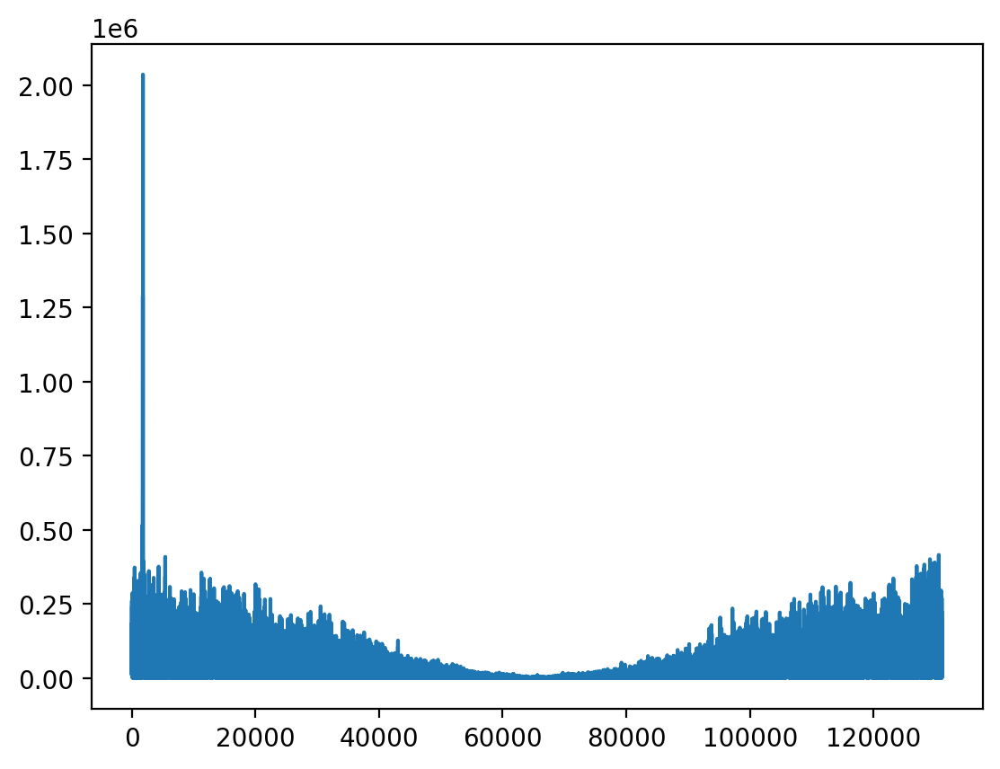

In [125]:
corr_fft = np.abs(np.fft.ifft( np.fft.fft(strain_scratch) * np.fft.fft(template_scratch).conjugate() )) 
print(corr_fft.shape)

plt.plot(corr_fft)

(2035182.2367850975, 67340)

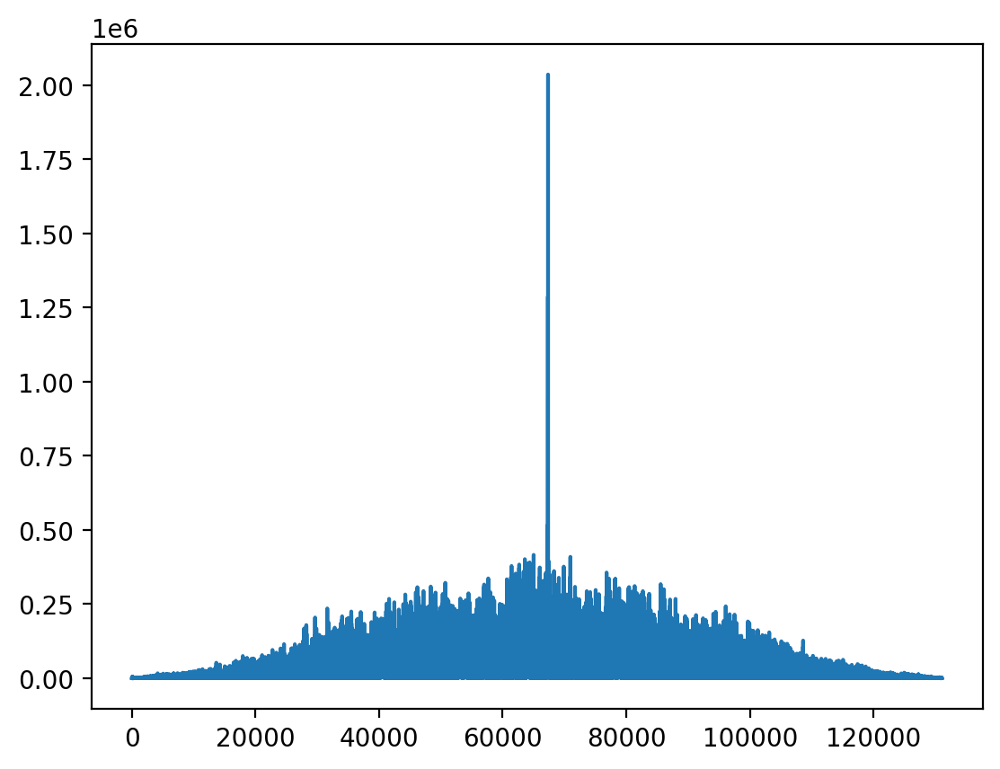

In [126]:
# Check
corr_scipy = abs(scipy.signal.correlate(strain_scratch, template_scratch, mode='same'))
plt.plot(corr_scipy)
max(abs(corr_scipy)), np.argmax(abs(corr_scipy))

(2035182.237237697, 67340)

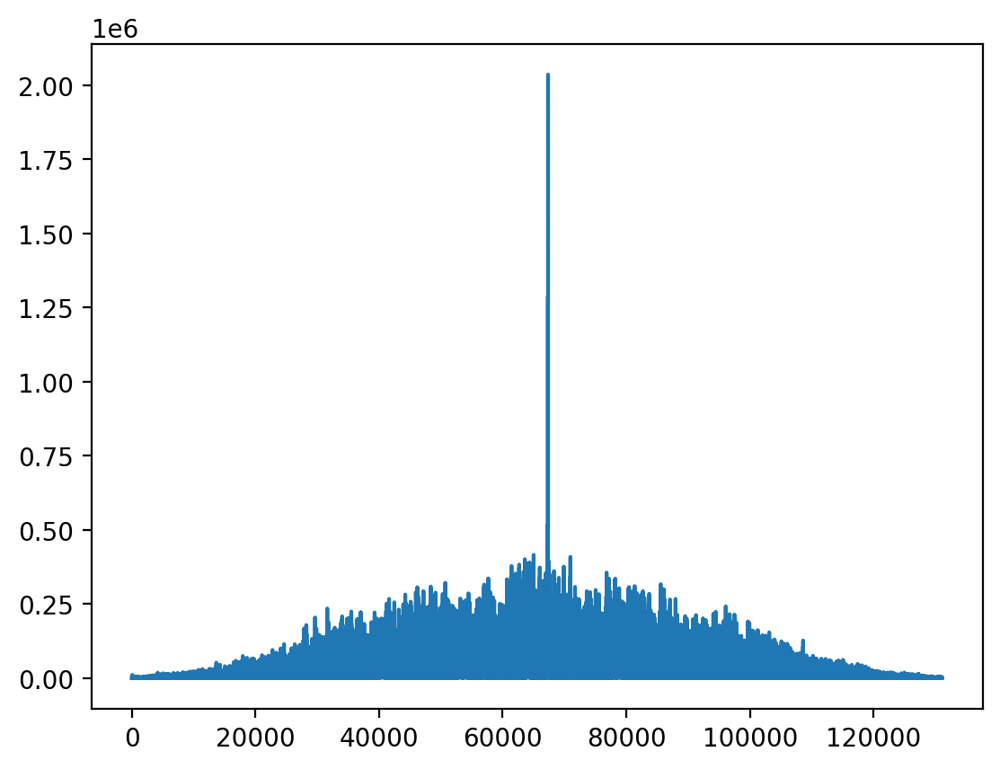

In [127]:
# Roll the corr_fft
plt.plot(np.roll(corr_fft, strain_scratch.size//2))
max(corr_fft), np.argmax(np.roll(corr_fft, strain_scratch.size//2))

(65000.0, 68000.0)

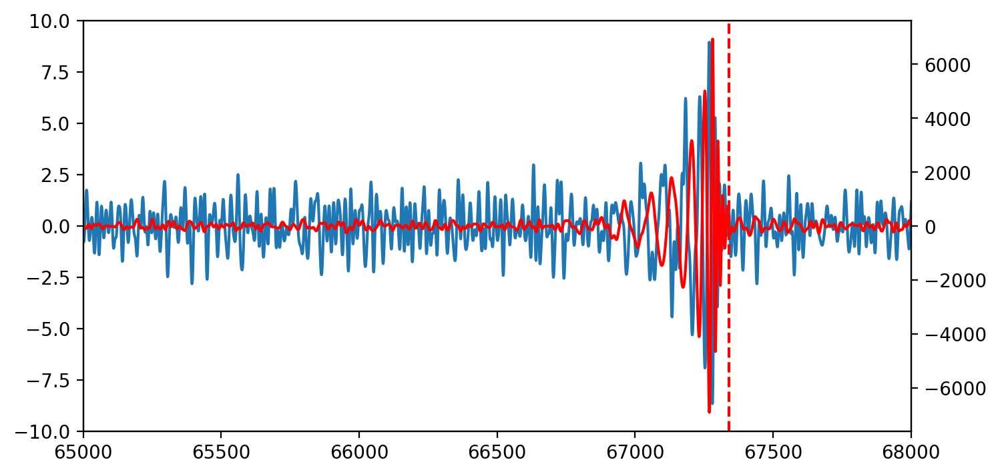

In [128]:
# Check
i = np.argmax(np.roll(corr_fft, strain_scratch.size//2))

plt.figure(figsize=(8,4))
plt.plot(strain_scratch)
plt.ylim(-10,10)
template_scratch_rolled = np.roll(np.append(template_scratch, np.zeros(template_scratch.size//2)),
                                     -template_scratch.size//2+i)[:strain_scratch.size]
plt.axvline(i, color='r', ls = '--')
plt.twinx()
plt.plot(template_scratch_rolled, 'r')
plt.xlim(6.5e4,6.8e4)

> Note again: 这是非常粗略的一种利用模板做相关性匹配找信号的演示。

## Matched filtering to find the signal

Matched filtering is the optimal way to find a known signal buried in stationary, Gaussian noise. It is the standard technique used by the gravitational wave community to find GW signals from compact binary mergers in noisy detector data.

For some loud signals, it may be possible to see the signal in the whitened data or spectrograms. On the other hand, low signal-to-noise ratio (SNR) signals or signals which are of long duration in time may not be visible, even in the whitened data. LIGO scientists use matched filtering to find such "hidden" signals. A matched filter works by compressing the entire signal into one time bin (by convention, the "end time" of the waveform).

LIGO uses a rather elaborate software suite to match the data against a family of such signal waveforms ("templates"), to find the best match. This procedure helps to "optimally" separate signals from instrumental noise, and to infer the parameters of the source (masses, spins, sky location, orbit orientation, etc) from the best match templates.

A blind search requires us to search over many compact binary merger templates (eg, 250,000) with different masses and spins, as well as over all times in all detectors, and then requiring triggers coincident in time and template between detectors. It's an extremely complex and computationally-intensive "search pipeline".

Here, we simplify things, using only one template (the one identified in the full search as being a good match to the data).

Assuming that the data around this event is fairly Gaussian and stationary, we'll use this simple method to identify the signal (matching the template) in our 32 second stretch of data. The peak in the SNR vs time is a "single-detector event trigger".

This calculation is described in section IV of: FINDCHIRP: An algorithm for detection of gravitational waves from inspiraling compact binaries B. Allen et al., PHYSICAL REVIEW D 85, 122006 (2012) ; http://arxiv.org/abs/gr-qc/0509116

The full search procedure is described in GW150914: First results from the search for binary black hole coalescence with Advanced LIGO, The LIGO Scientific Collaboration, the Virgo Collaboration, http://arxiv.org/abs/1602.03839

REF: https://iphysresearch.github.io/PhDthesis_html/C2/#245


假设引力波数据中含有一个已知波形模板 $g(t)$, 但未知振幅 $A$ 和未知到达时间 $t_0$ 的信号 $h(t)=A g\left(t-t_0\right)$, 该信号的傅里叶变换为
$$
\tilde{h}(f)=A \tilde{g}(f) e^{-2 \pi i f t_0}
$$

由此，我们可以计算其探测统计量(即匹配滤波内积)
$$
\langle d \mid h\rangle=2 A \int_{-\infty}^{\infty} \frac{\tilde{d}(f) \tilde{g}^*(f)}{S_n(|f|)} e^{2 \pi i f t_0} d f=A\langle d \mid g\rangle\left(t_0\right)
$$

上式中, 我们已经定义了一个含时的内积:
$$
\langle d \mid h\rangle(t):=2 \int_{-\infty}^{\infty} \frac{\tilde{d}(f) \tilde{h}^*(f)}{S_n(|f|)} e^{2 \pi i f t} d f
$$

它可以表示为在各种可能的到达时间 $t$ 下匹配滤波内积的时间序列。所以, 我们就可以进一步将信噪比的定义推广到含时的匹配滤波信噪比 $\rho_{\mathrm{mf}}(t)$ :
$$
\rho_{\mathrm{mf}}(t):=\frac{|\langle d \mid h\rangle(t)|}{\sqrt{\langle h \mid h\rangle}}
$$

其中，
$$
\langle d \mid h\rangle :=4 \Re \int_0^{\infty} \frac{\tilde{d}(f) \tilde{h}^*(f)}{S_n(f)} d f
$$

由此可见, 最大似然探测统计对应于在给定时间区间上 $\rho_{\mathrm{mf}}$ 的最大值。

到达时间的估计也就对应于该最大值所对应的时间 $t_{\text {peak }}=t_0$, 而波形幅度即为相应的最大似然估计 $A_{\max }=\rho\left(t_{\mathrm{peak}}\right)$ 。

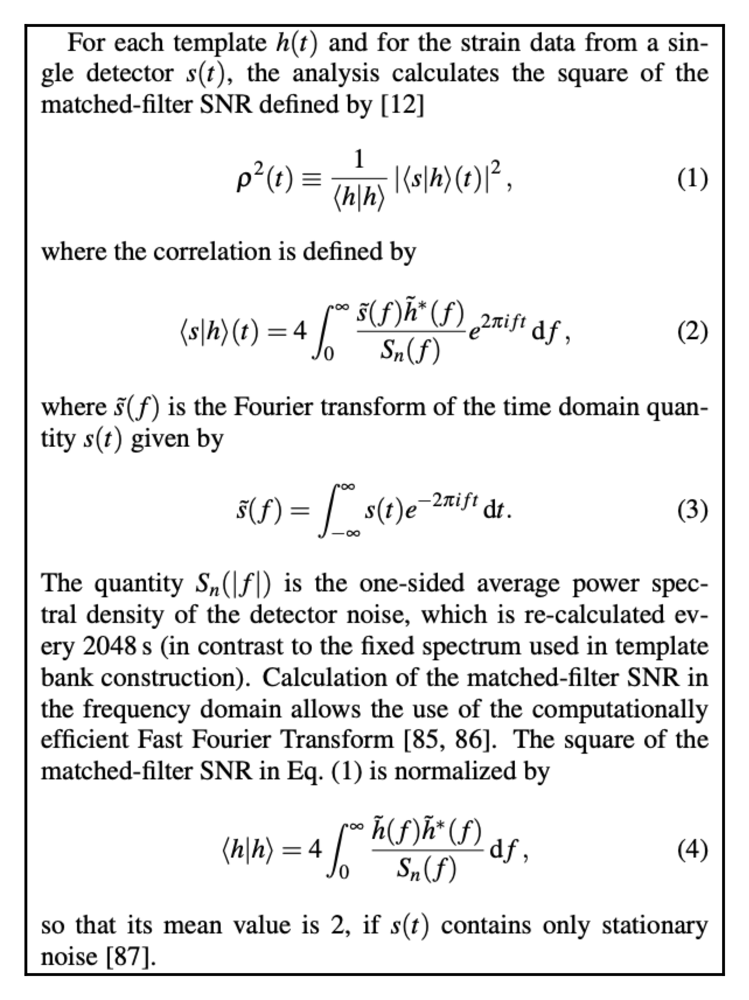

In [129]:
image = plt.imread('LOSC_Event_tutorial/mf.png')
plt.figure(dpi=300)
plt.imshow(image)
plt.xticks([])
plt.yticks([]);

For detector H1, maximum at 1126259462.4395 with SNR = 18.6, D_eff = 814.44, horizon = 1889.6 Mpc
For detector L1, maximum at 1126259462.4324 with SNR = 13.2, D_eff = 999.74, horizon = 1650.6 Mpc


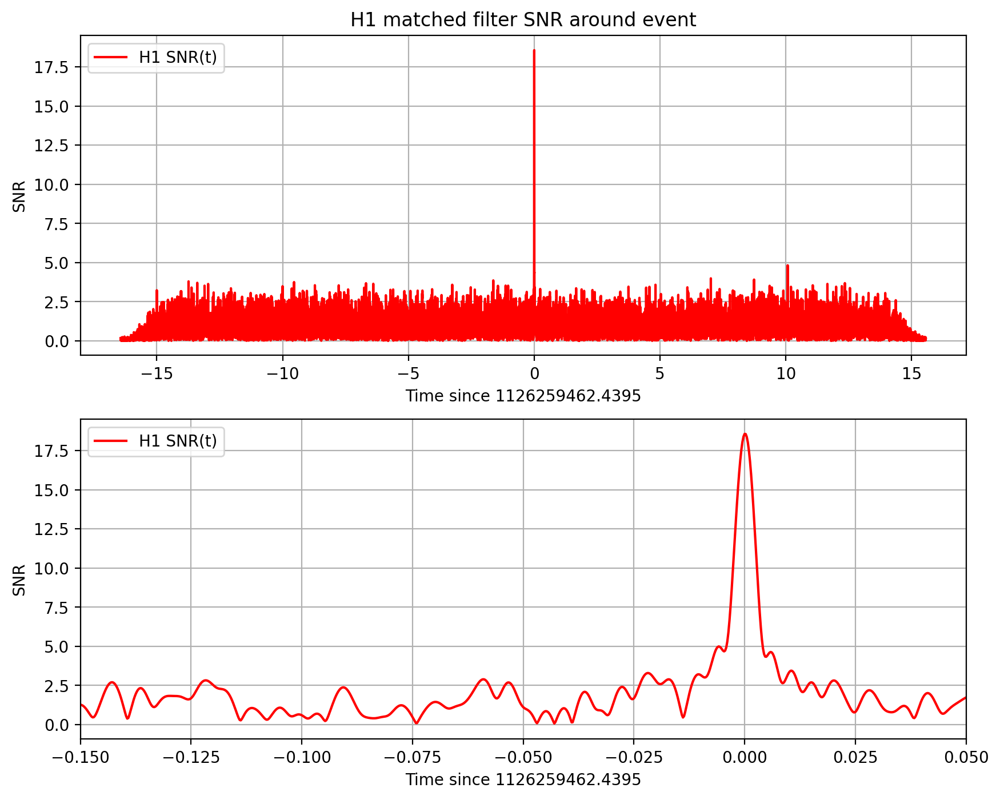

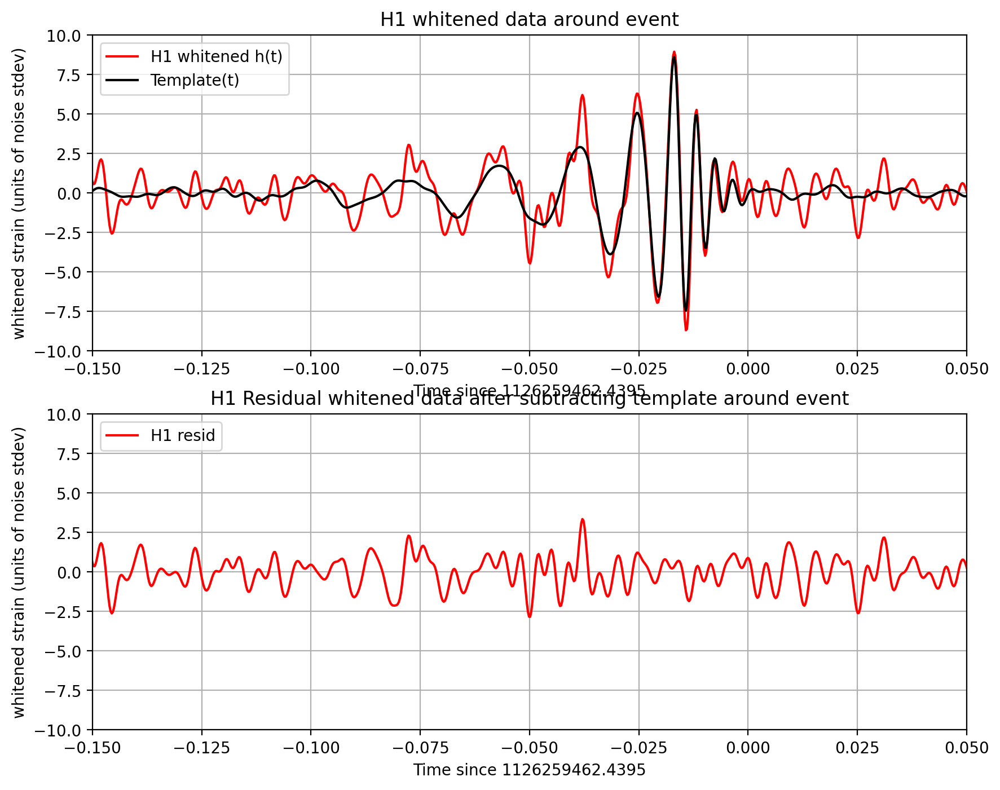

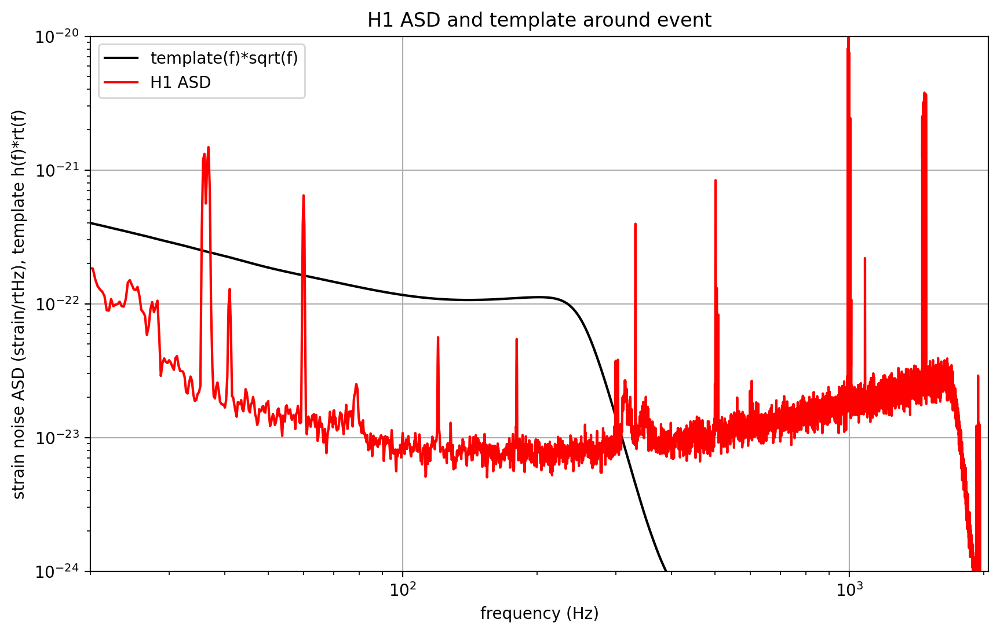

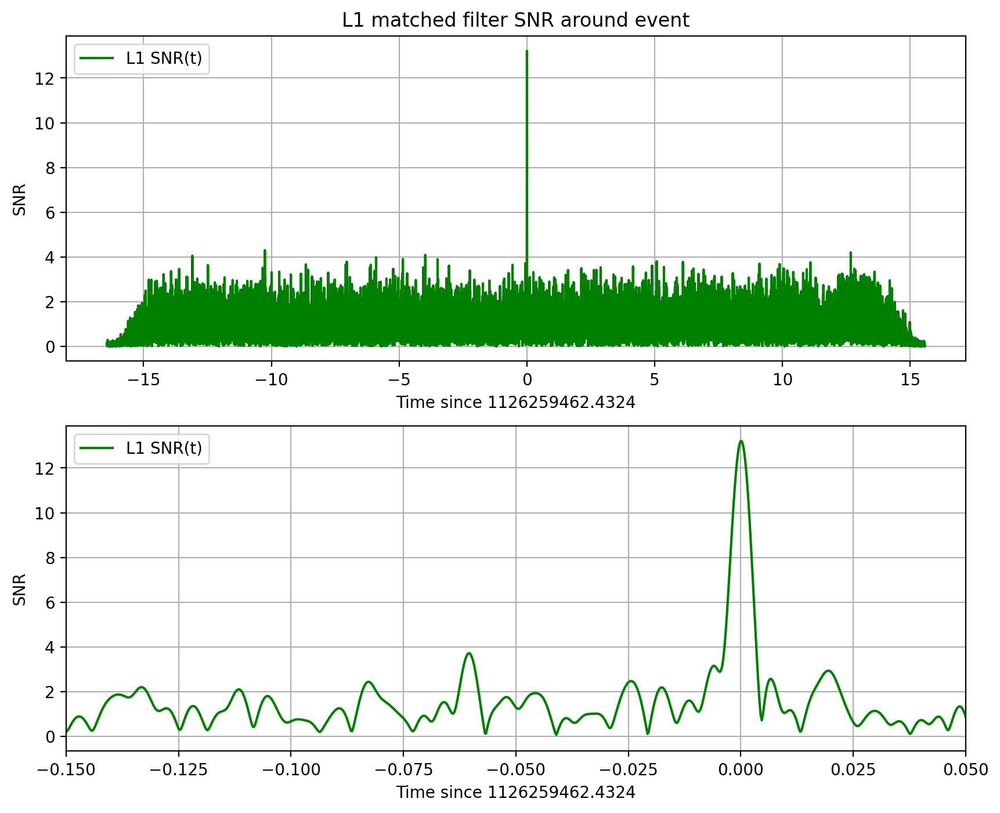

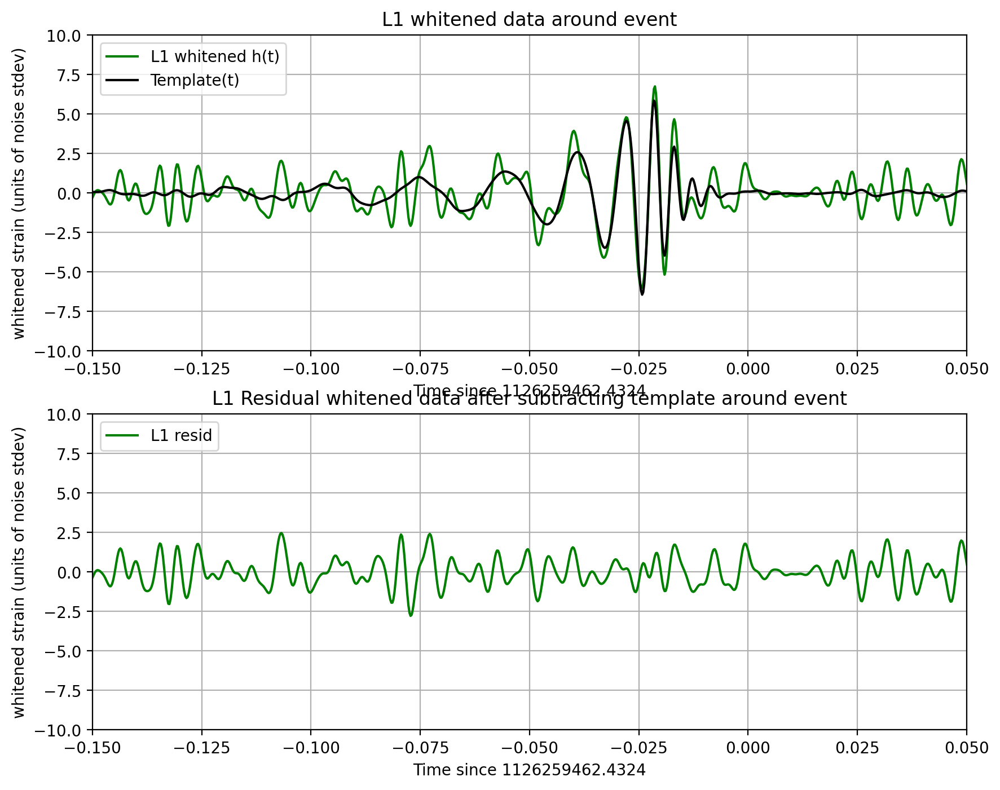

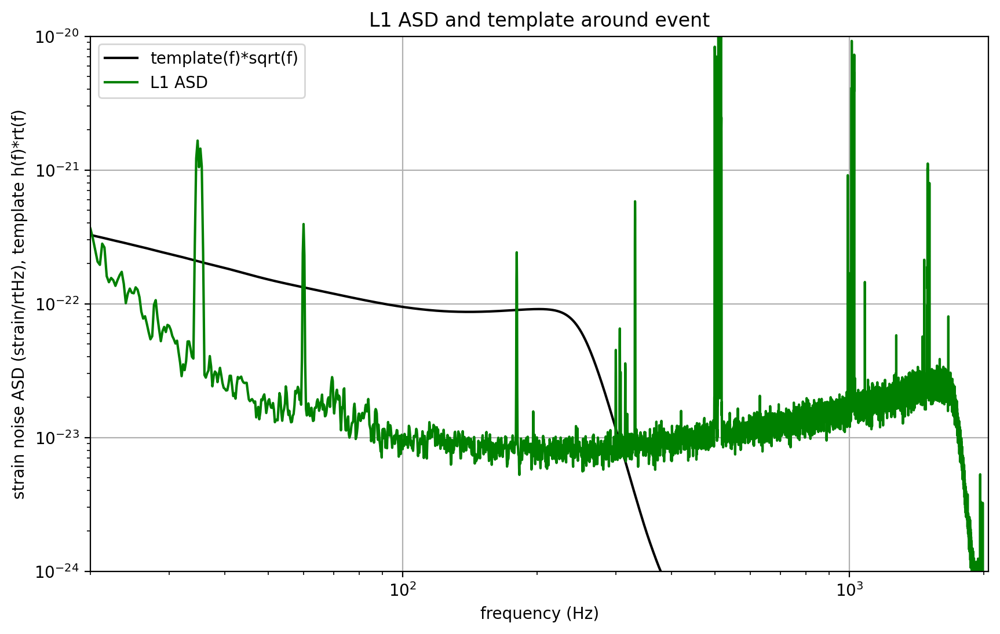

In [130]:
# -- To calculate the PSD of the data, choose an overlap and a window (common to all detectors)
#   that minimizes "spectral leakage" https://en.wikipedia.org/wiki/Spectral_leakage
NFFT = 4*fs
psd_window = np.blackman(NFFT)
# and a 50% overlap:
NOVL = NFFT//2

# define the complex template, common to both detectors:
template = (template_p + template_c*1.j) 
# We will record the time where the data match the END of the template.
etime = time+template_offset
# the length and sampling rate of the template MUST match that of the data.
datafreq = np.fft.fftfreq(template.size)*fs
df = np.abs(datafreq[1] - datafreq[0])

# to remove effects at the beginning and end of the data stretch, window the data
# https://en.wikipedia.org/wiki/Window_function#Tukey_window
try:   dwindow = scipy.signal.windows.tukey(template.size, alpha=1./8)  # Tukey window preferred, but requires recent scipy version 
except: dwindow = scipy.signal.windows.blackman(template.size)          # Blackman window OK if Tukey is not available

# prepare the template fft.
template_fft = np.fft.fft(template*dwindow) / fs

# loop over the detectors
dets = ['H1', 'L1']
for det in dets:

    if det == 'L1': data = strain_L1.copy()
    else:           data = strain_H1.copy()

    # -- Calculate the PSD of the data.  Also use an overlap, and window:
    data_psd, freqs = mlab.psd(data, Fs = fs, NFFT = NFFT, window=psd_window, noverlap=NOVL)

    # Take the Fourier Transform (FFT) of the data and the template (with dwindow)
    data_fft = np.fft.fft(data*dwindow) / fs

    # -- Interpolate to get the PSD values at the needed frequencies
    power_vec = np.interp(np.abs(datafreq), freqs, data_psd)

    # -- Calculate the matched filter output in the time domain:
    # Multiply the Fourier Space template and data, and divide by the noise power in each frequency bin.
    # Taking the Inverse Fourier Transform (IFFT) of the filter output puts it back in the time domain,
    # so the result will be plotted as a function of time off-set between the template and the data:
    optimal = data_fft * template_fft.conjugate() / power_vec
    optimal_time = 2*np.fft.ifft(optimal)*fs

    # -- Normalize the matched filter output:
    # Normalize the matched filter output so that we expect a value of 1 at times of just noise.
    # Then, the peak of the matched filter output will tell us the signal-to-noise ratio (SNR) of the signal.
    sigmasq = 1*(template_fft * template_fft.conjugate() / power_vec).sum() * df
    sigma = np.sqrt(np.abs(sigmasq))
    SNR_complex = optimal_time/sigma

    # shift the SNR vector by the template length so that the peak is at the END of the template
    peaksample = int(data.size / 2)  # location of peak in the template
    SNR_complex = np.roll(SNR_complex,peaksample)
    SNR = abs(SNR_complex)

    # find the time and SNR value at maximum:
    indmax = np.argmax(SNR)
    timemax = time[indmax]
    SNRmax = SNR[indmax]

    # Calculate the "effective distance" (see FINDCHIRP paper for definition)
    # d_eff = (8. / SNRmax)*D_thresh
    d_eff = sigma / SNRmax
    # -- Calculate optimal horizon distnace
    horizon = sigma/8

    # Extract time offset and phase at peak
    phase = np.angle(SNR_complex[indmax])
    offset = (indmax-peaksample)

    # apply time offset, phase, and d_eff to template 
    template_phaseshifted = np.real(template*np.exp(1j*phase))    # phase shift the template
    template_rolled = np.roll(template_phaseshifted,offset) / d_eff  # Apply time offset and scale amplitude
    
    # Whiten and band-pass the template for plotting
    template_whitened = whiten(template_rolled,interp1d(freqs, data_psd),dt)  # whiten the template
    template_match = filtfilt(bb, ab, template_whitened) / normalization # Band-pass the template
    
    print('For detector {0}, maximum at {1:.4f} with SNR = {2:.1f}, D_eff = {3:.2f}, horizon = {4:0.1f} Mpc' 
          .format(det,timemax,SNRmax,d_eff,horizon))

    if make_plots:

        # plotting changes for the detectors:
        if det == 'L1': 
            pcolor='g'
            strain_whitenbp = strain_L1_whitenbp
            template_L1 = template_match.copy()
        else:
            pcolor='r'
            strain_whitenbp = strain_H1_whitenbp
            template_H1 = template_match.copy()

        # -- Plot the result
        plt.figure(figsize=(10,8))
        plt.subplot(2,1,1)
        plt.plot(time-timemax, SNR, pcolor,label=det+' SNR(t)')
        #plt.ylim([0,25.])
        plt.grid('on')
        plt.ylabel('SNR')
        plt.xlabel('Time since {0:.4f}'.format(timemax))
        plt.legend(loc='upper left')
        plt.title(det+' matched filter SNR around event')

        # zoom in
        plt.subplot(2,1,2)
        plt.plot(time-timemax, SNR, pcolor,label=det+' SNR(t)')
        plt.grid('on')
        plt.ylabel('SNR')
        plt.xlim([-0.15,0.05])
        #plt.xlim([-0.3,+0.3])
        plt.grid('on')
        plt.xlabel('Time since {0:.4f}'.format(timemax))
        plt.legend(loc='upper left')
        # plt.savefig(eventname+"_"+det+"_SNR."+plottype)

        plt.figure(figsize=(10,8))
        plt.subplot(2,1,1)
        plt.plot(time-tevent,strain_whitenbp,pcolor,label=det+' whitened h(t)')
        plt.plot(time-tevent,template_match,'k',label='Template(t)')
        plt.ylim([-10,10])
        plt.xlim([-0.15,0.05])
        plt.grid('on')
        plt.xlabel('Time since {0:.4f}'.format(timemax))
        plt.ylabel('whitened strain (units of noise stdev)')
        plt.legend(loc='upper left')
        plt.title(det+' whitened data around event')

        plt.subplot(2,1,2)
        plt.plot(time-tevent,strain_whitenbp-template_match,pcolor,label=det+' resid')
        plt.ylim([-10,10])
        plt.xlim([-0.15,0.05])
        plt.grid('on')
        plt.xlabel('Time since {0:.4f}'.format(timemax))
        plt.ylabel('whitened strain (units of noise stdev)')
        plt.legend(loc='upper left')
        plt.title(det+' Residual whitened data after subtracting template around event')
        # plt.savefig(eventname+"_"+det+"_matchtime."+plottype)
                 
        # -- Display PSD and template
        # must multiply by sqrt(f) to plot template fft on top of ASD:
        plt.figure(figsize=(10,6))
        template_f = np.absolute(template_fft)*np.sqrt(np.abs(datafreq)) / d_eff
        plt.loglog(datafreq, template_f, 'k', label='template(f)*sqrt(f)')
        plt.loglog(freqs, np.sqrt(data_psd),pcolor, label=det+' ASD')
        plt.xlim(20, fs/2)
        plt.ylim(1e-24, 1e-20)
        plt.grid()
        plt.xlabel('frequency (Hz)')
        plt.ylabel('strain noise ASD (strain/rtHz), template h(f)*rt(f)')
        plt.legend(loc='upper left')
        plt.title(det+' ASD and template around event')
        # plt.savefig(eventname+"_"+det+"_matchfreq."+plottype)

- Notes on these results

    - We make use of only one template, with a simple ASD estimate. The full analysis produces a Bayesian posterior result using many nearby templates. It does a more careful job estimating the ASD, and includes effects of uncertain calibration.
    - As a result, our parameters (SNR, masses, spins, D_eff) are somewhat different from what you will see in our papers.
    - We compute an "effective distance" D_eff. Is is NOT an estimate of the actual (luminosity) distance, which depends also on the source location and orbit orientation.
    - These distances are at non-zero redshift, so cosmological effects must be taken into account (neglected here). Since we estimate the BH masses using the phase evolution of the waveform, which has been redshifted, our masses are themselves "redshifted". The true source masses must be corrected for this effect; they are smaller by a factor (1+z).